# IEEE-CIS Fraud Detection
[kaggle 링크](https://www.kaggle.com/c/ieee-fraud-detection)
- 유선화
- kaggle 프로젝트


### Reference
- [1](https://www.kaggle.com/artgor/eda-and-models)
- [2](https://www.kaggle.com/kabure/extensive-eda-and-modeling-xgb-hyperopt)

# Contents

[0. Overview](#0.-Overview) <br>
[1. EDA](#1.-EDA) <br>
- [Features](#Features)

[2. Feature Engineering](#2.-Feature-Engineering) <br>
[3. Modeling](#3.-Modeling)

# 0. Overview

IEEE-CIS works across a variety of AI and machine learning areas, including deep neural networks, fuzzy systems, evolutionary computation, and swarm intelligence. Today they’re partnering with the world’s leading payment service company, Vesta Corporation, seeking the best solutions for fraud prevention industry, and now you are invited to join the challenge.


In this competition, you’ll benchmark machine learning models on a challenging large-scale dataset. The data comes from Vesta's real-world e-commerce transactions and contains a wide range of features from device type to product features. You also have the opportunity to create new features to improve your results.


If successful, you’ll improve the efficacy of fraudulent transaction alerts for millions of people around the world, helping hundreds of thousands of businesses reduce their fraud loss and increase their revenue. And of course, you will save party people just like you the hassle of false positives.


Submissions are evaluated on **area under the ROC curve** between the predicted probability and the observed target.


In this competition you are predicting the probability that an online transaction is fraudulent, as denoted by the binary target `isFraud`.


The data is broken into two files `identity` and `transaction`, which are joined by `TransactionID`. Not all transactions have corresponding identity information.


Categorical Features - Transaction
- `ProductCD`
- `card1` - `card6`
- `addr1`, `addr2`
- `P_emaildomain`
- `R_emaildomain`
- `M1` - `M9`

Categorical Features - Identity
- `DeviceType`
- `DeviceInfo`
- `id_12` - `id_38`


The TransactionDT feature is a timedelta from a given reference datetime (not an actual timestamp).


[Contents](#Contents)

# 1. EDA

### Setting

In [79]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib

import gc

In [2]:
matplotlib.rcParams['axes.unicode_minus'] = False
sns.set()

In [3]:
pd.set_option('max_rows', 999)
pd.set_option('max_seq_items', 999)
# pd.set_option('max_info_columns', 100)

### Data

In [4]:
train_identity = pd.read_csv('data/train_identity.csv')
print('- train identity dataset')
print(train_identity.shape, '\n')

train_transaction = pd.read_csv('data/train_transaction.csv')
print('- train transaction dataset')
print(train_transaction.shape, '\n')

test_identity = pd.read_csv('data/test_identity.csv')
print('- test identity dataset')
print(test_identity.shape, '\n')

test_transaction = pd.read_csv('data/test_transaction.csv')
print('- test transaction dataset')
print(test_transaction.shape, '\n')

- train identity dataset
(144233, 41) 

- train transaction dataset
(590540, 394) 

- test identity dataset
(141907, 41) 

- test transaction dataset
(506691, 393) 



In [5]:
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 590540 entries, 0 to 590539
Columns: 434 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(4), object(31)
memory usage: 1.9+ GB


In [6]:
train.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7',
       'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17',
       'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27',
       'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37',
       'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47',
       'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57',
       'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67',
       'V6

In [13]:
del train_identity, train_transaction
gc.collect()

14

In [7]:
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 506691 entries, 0 to 506690
Columns: 433 entries, TransactionID to DeviceInfo
dtypes: float64(399), int64(3), object(31)
memory usage: 1.6+ GB


In [8]:
test.columns

Index(['TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD',
       'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2',
       'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3',
       'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14',
       'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11',
       'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7',
       'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30',
       'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40',
       'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50',
       'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60',
       'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70',


In [9]:
## column name 변경 ('-' 부분 '_'로 변경)
for col in test.columns:
    if '-' in col:
        temp = col.replace('-', '_')
        test.rename(columns={col:temp}, inplace=True)
        
del col, temp
test.columns

Index(['TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD',
       'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2',
       'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3',
       'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14',
       'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11',
       'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7',
       'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30',
       'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40',
       'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50',
       'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60',
       'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70',


In [14]:
del test_identity, test_transaction
gc.collect()

0

### Target

0 : No Fraud <br>
1 : Fraud <br>
클래스 불균형이 심하다.

> **클래스 불균형** 문제를 어떻게 해결할 것인지 고민해야 한다.

In [16]:
train['isFraud'].value_counts()

0    569877
1     20663
Name: isFraud, dtype: int64

### Duplicated Value

중복 데이터가 있는지 확인했다. 중복 데이터는 없었다.

In [44]:
train.duplicated(train.columns).sum()

0

In [45]:
test.duplicated(test.columns).sum()

0

### One Unique Value

각 컬럼에서 하나의 값만 가지거나 결측치만 가지는 컬럼을 확인했다.


- train set : 0 columns 
- test set : 1 column


test set에서 `V107` 컬럼이 *1.0*으로 하나의 값만 가졌다.
train set에서도 `V107` 컬럼의 *1.0* 값이 99% 이상이었다. 정보력이 약한 컬럼이라 판단되어 제거했다.

In [16]:
[col for col in train.columns if train[col].nunique() <= 1]

[]

In [20]:
[col for col in test.columns if test[col].nunique() <= 1]

['V107']

In [21]:
train['V107'].nunique()

2

In [22]:
test['V107'].nunique()

1

In [23]:
train['V107'].value_counts(normalize=True, dropna=False)

1.0    0.999048
NaN    0.000532
0.0    0.000420
Name: V107, dtype: float64

In [28]:
train.groupby(['isFraud', 'V107'])['V107'].count()

isFraud  V107
0        0.0        245
         1.0     569335
1        0.0          3
         1.0      20643
Name: V107, dtype: int64

In [24]:
test['V107'].value_counts(normalize=True, dropna=False)

1.0    1.0
Name: V107, dtype: float64

In [29]:
train.drop('V107', axis=1, inplace=True)
test.drop('V107', axis=1, inplace=True)

### Missing Value

결측치 있는 컬럼이 굉장히 많다.

> 결측치를 어떻게 처리할 것인지 고민해야한다.


- train set : 414 columns (including `V107` columns)
- test set : 385 columns


train set에서는 결측치가 없지만, test set에서는 결측치가 존재하는 컬럼 <br>
`C1`, `C2`, `C3`, `C4`, `C5`, `C6`, `C7`, `C8`, `C9`, `C10`, `C11`, `C12`, `C13`, `C14`


결측치가 80% 이상 존재하는 컬럼은 74개이다.

In [30]:
train.isnull().any().sum()

413

In [31]:
test.isnull().any().sum()

385

In [12]:
set(test.loc[:, test.isnull().sum() > 0].columns) - set(train.loc[:, train.isnull().sum() > 0].columns)

{'C1',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9'}

In [47]:
len(set(train.loc[:, train.isnull().sum() > 0].columns) - set(test.loc[:, test.isnull().sum() > 0].columns))

42

In [41]:
len(set(train.loc[:, train.isnull().mean() > 0.8].columns) | set(test.loc[:, test.isnull().mean() > 0.8].columns))

74

### 1-2 그래프

In [44]:
def dist(val):
    plt.figure(figsize=(8,4))
    sns.distplot(val, norm_hist=True, color='#F19CBB', bins=50)
    plt.show()
    
def violin(x, y, data, hue=None):
    plt.figure(figsize=(12,8))
    sns.violinplot(x=x, y=y, data=data, hue=hue, palette=sns.set_palette(['#F19CBB', '#64B5CD', '#A38CF4']))
    plt.show()
    
def scatter(data, feat):    
    g = sns.pairplot(
        data,
        vars=feat,
        hue='isFraud', 
        palette='husl',
        plot_kws={'alpha':0.2}
    )
    
    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(60)
    
    g.fig.set_size_inches(20,18)
    # plt.savefig('graph/scatter.png', bbox_inches='tight')
    plt.show()
    plt.close()
    gc.collect()

In [85]:
train.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38',
       'DeviceType', 'DeviceInfo'],
      dtype='object', length=434)

In [86]:
cat_col = [
    'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
    'addr1', 'addr2', 'P_emaildomain', 'R_emaildomain',
    'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9',
    'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19',
    'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27',
    'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35',
    'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo'
]

num_col = []
for col in train.columns:
    if not col in cat_col:
        num_col.append(col)

num_col.remove('TransactionID')
num_col.remove('isFraud')
num_col.remove('TransactionDT')

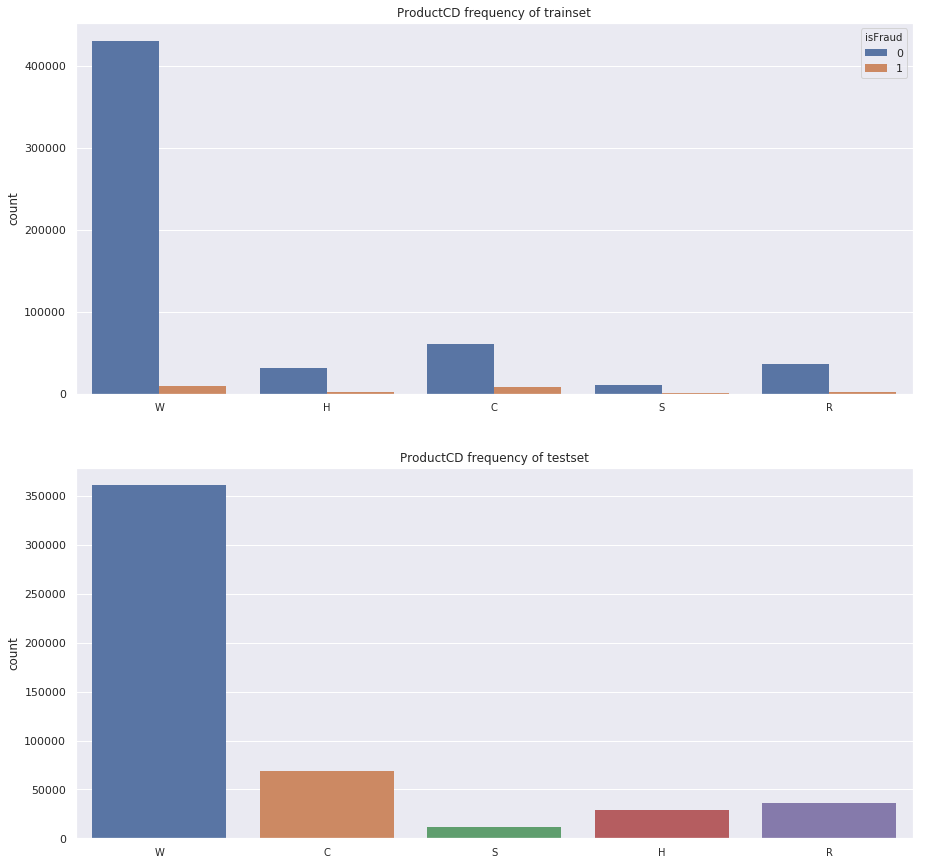

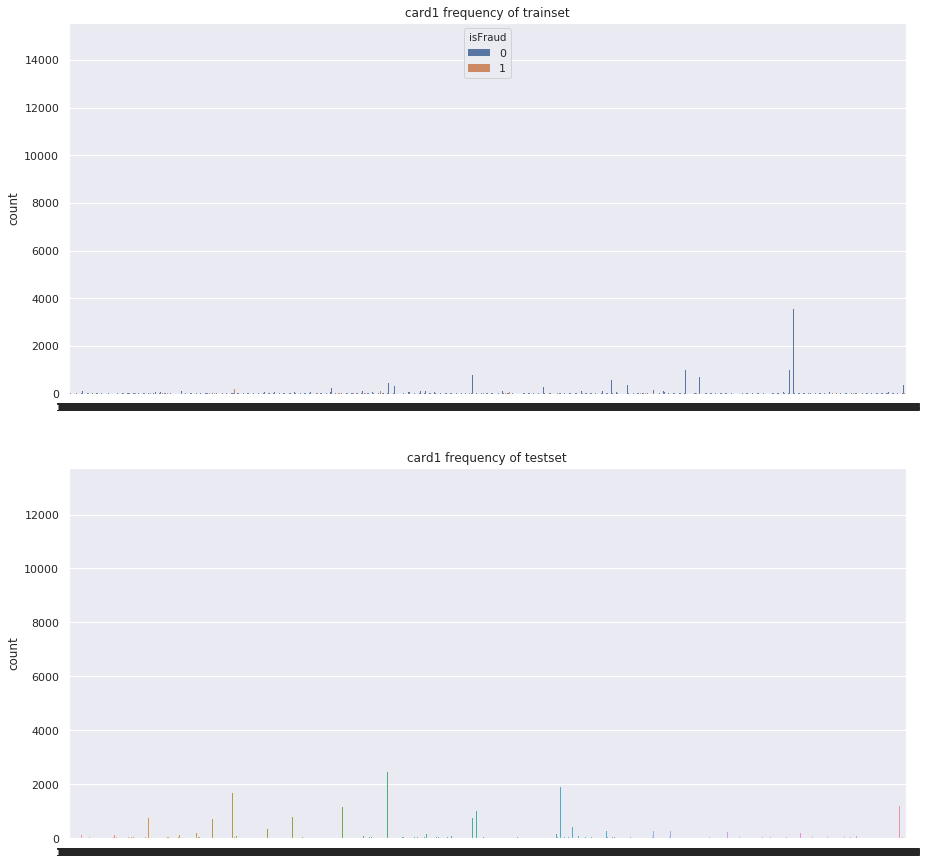

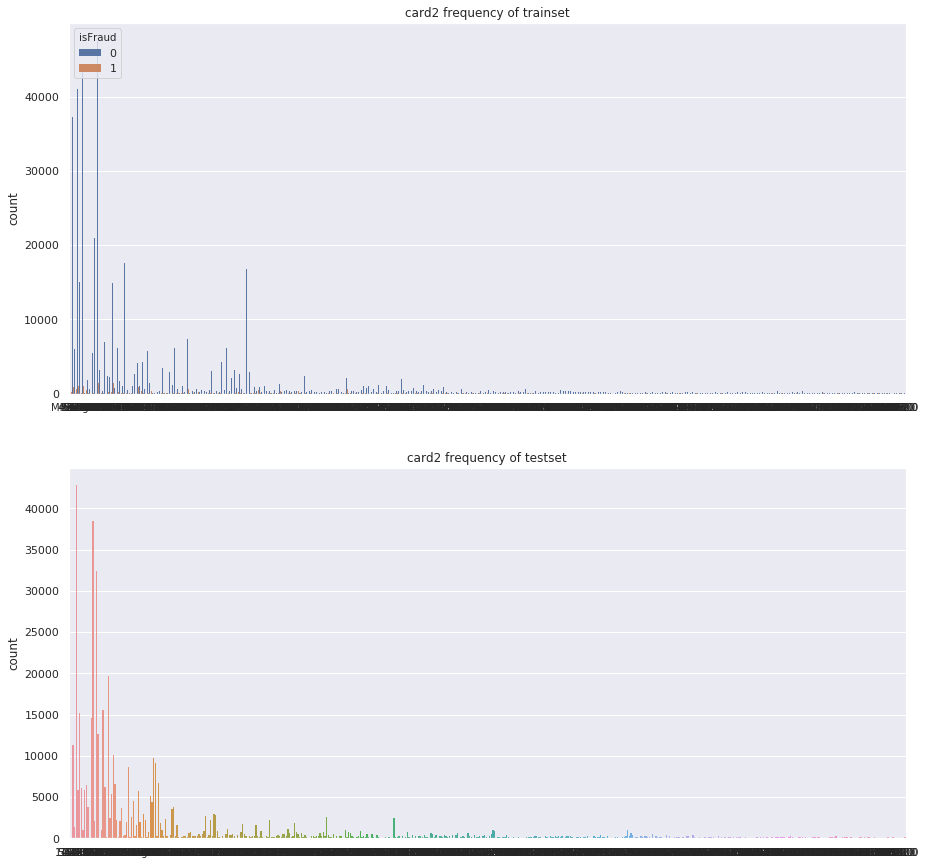

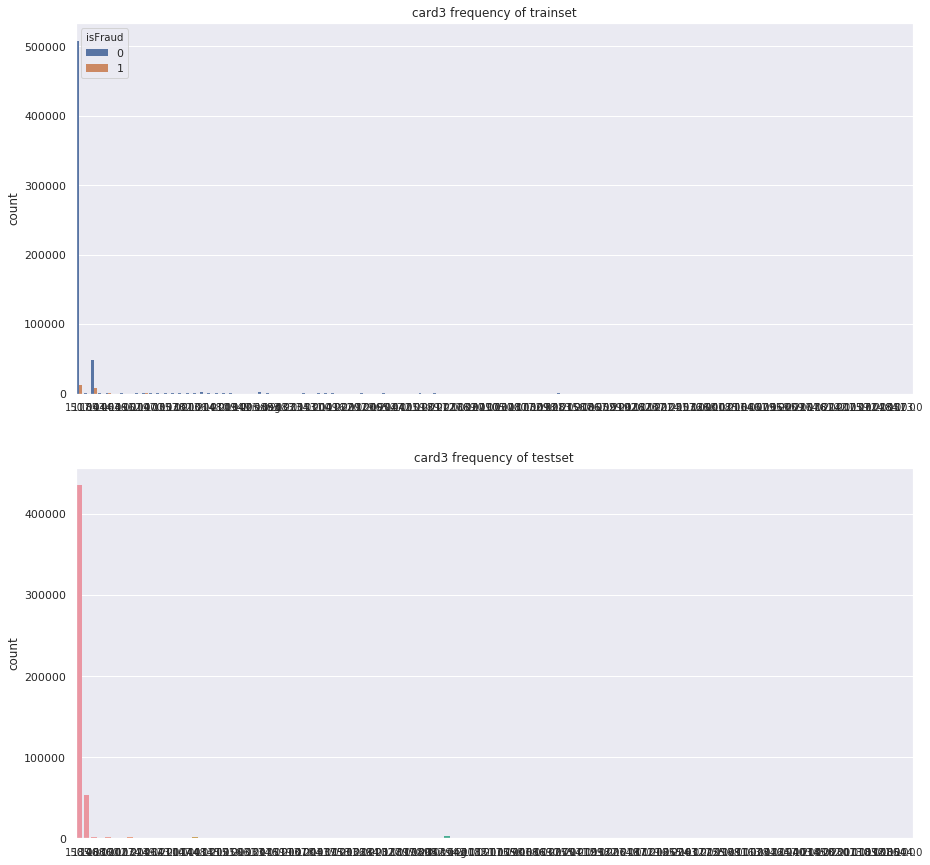

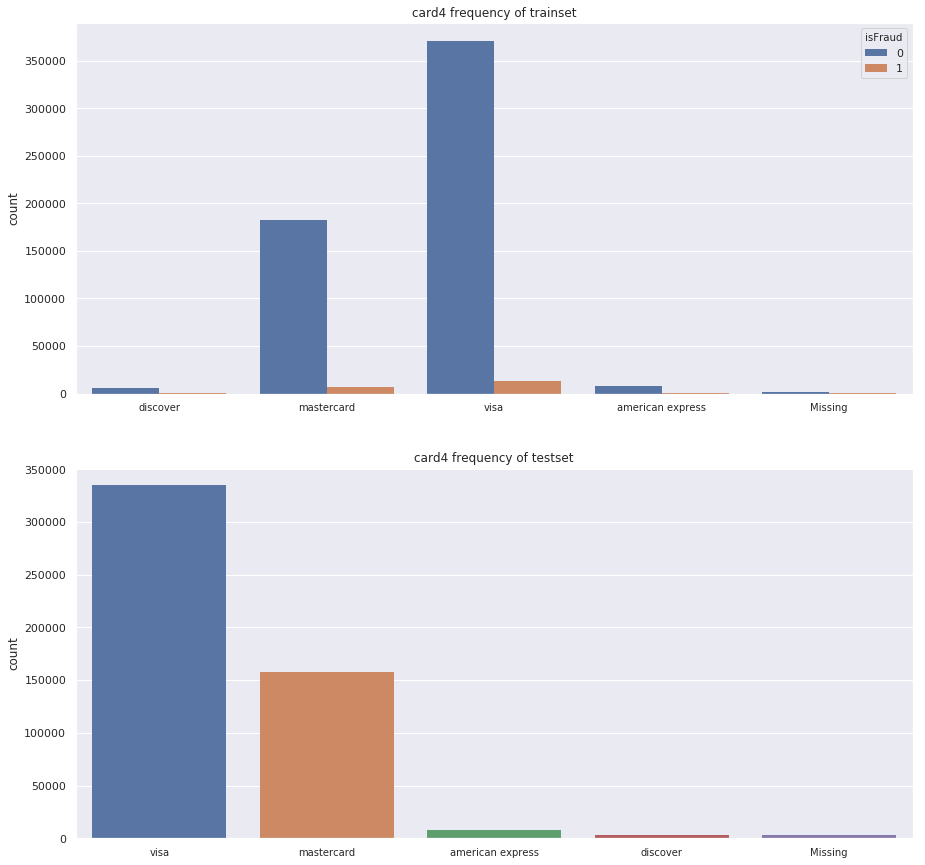

...

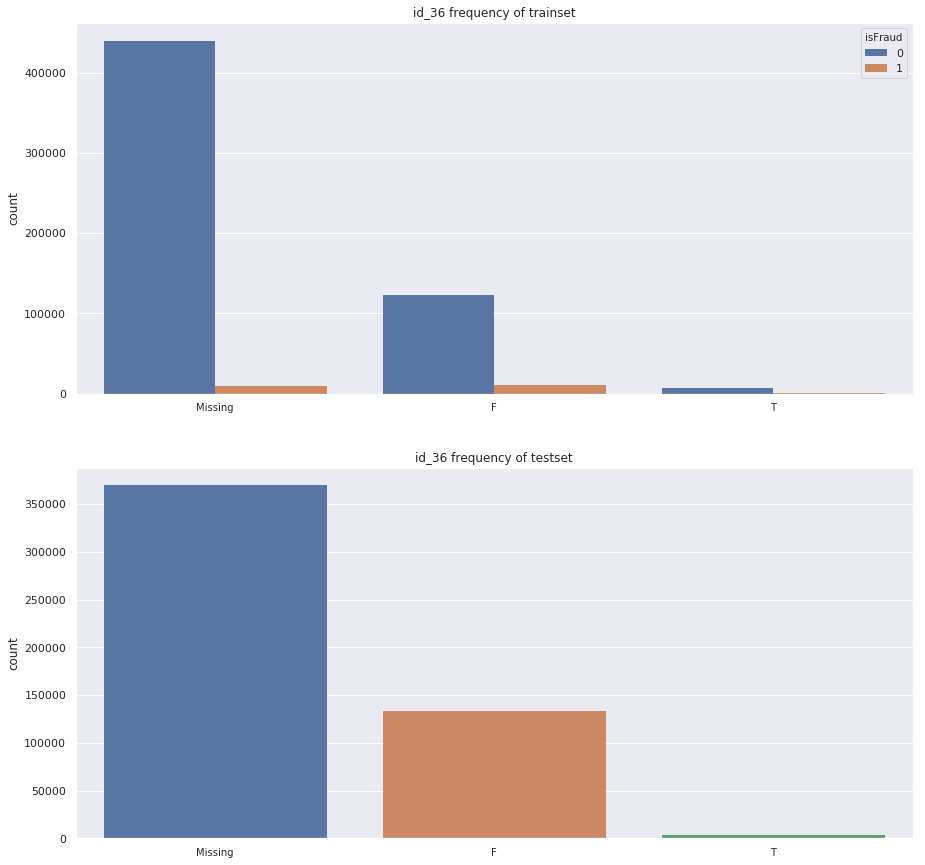

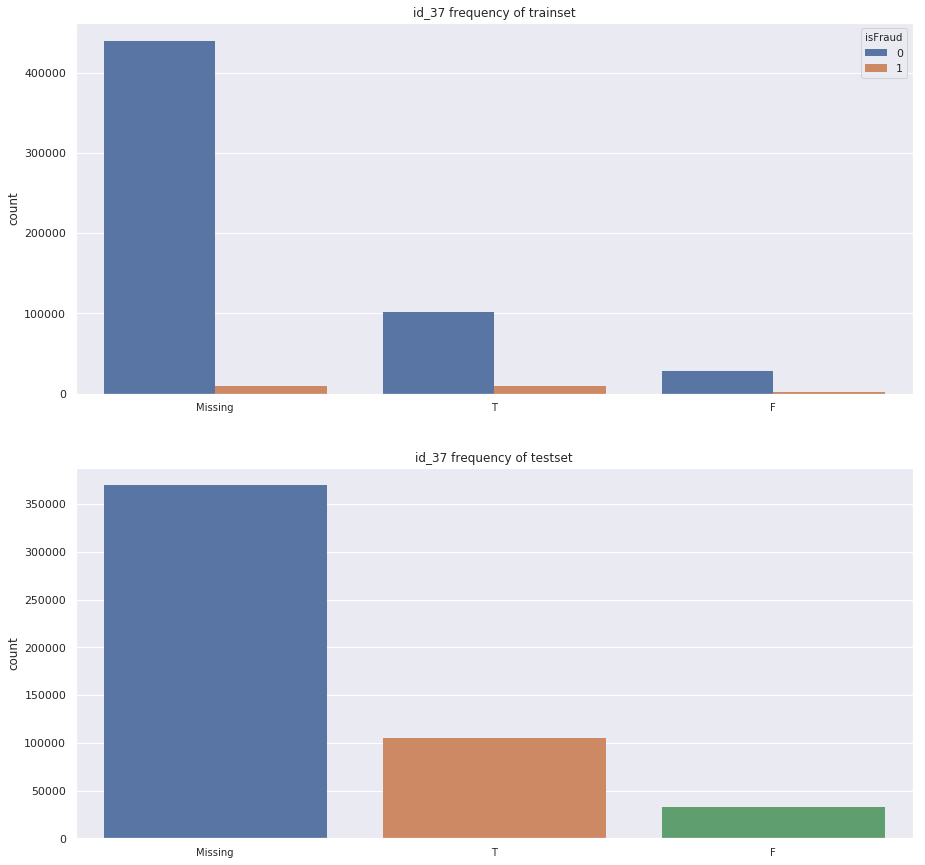

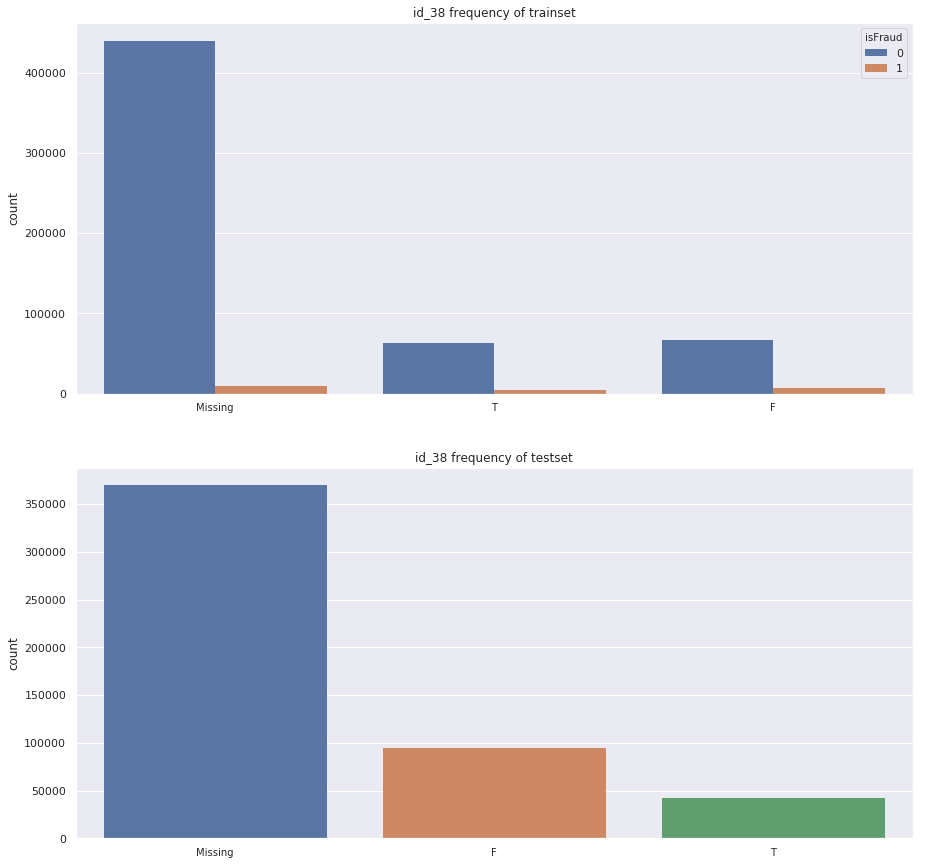

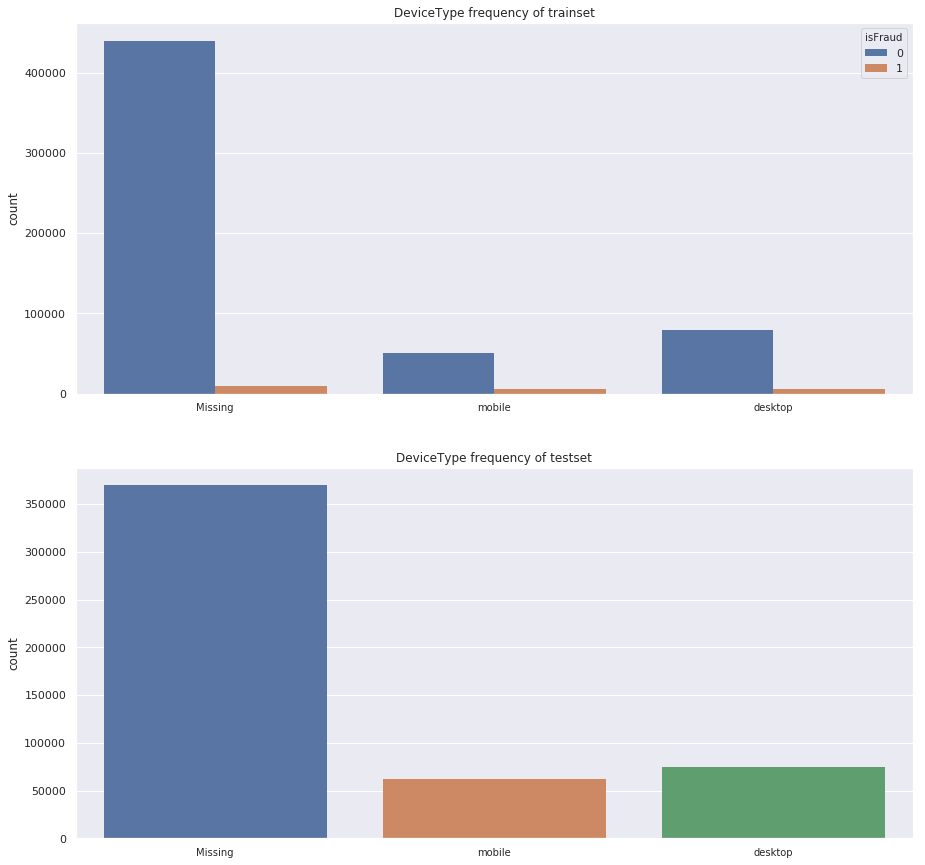

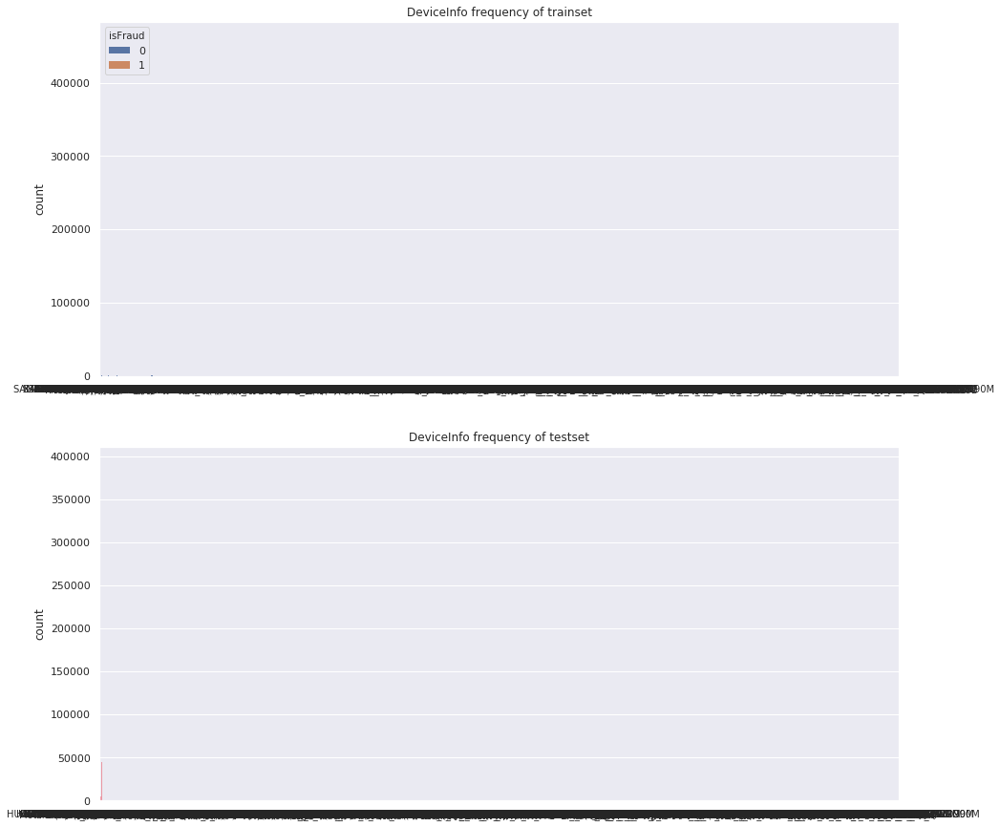

In [59]:
# for col in cat_col:
#     train[col] = train[col].fillna('Missing')
#     test[col] = test[col].fillna('Missing')
#     sns.set(rc={'figure.figsize':(15,15)})
    
#     plt.subplot(2,1,1)
#     plt.title(col + ' frequency of trainset')
#     sns.countplot(col, hue='isFraud', data=train, linewidth=0)
#     plt.xticks(fontsize="small")
#     plt.xlabel('')
    
#     plt.subplot(2,1,2)
#     plt.title(col + ' frequency of testset')
#     sns.countplot(col, data=test, linewidth=0)
#     plt.xticks(fontsize="small")
#     plt.xlabel('')

#     plt.show()
#     plt.close()
#     gc.collect()

In [114]:
# temp_train = train.copy()
# temp_test = test.copy()

# for col in cat_col:
#     print('<{}>'.format(col))
#     temp_train[col].fillna('Miss')
#     temp_test[col].fillna('Miss')
#     print('- train')
#     print(temp_train.groupby(['isFraud', col])[col].count().head(10))
#     print(temp_train[col].value_counts(dropna=False, normalize=True).head(10), '\n')
#     print('- test')
#     print(temp_test[col].value_counts(dropna=False, normalize=True).head(10), '\n')

<ProductCD>
- train
isFraud  ProductCD
0        C             60511
         H             31450
         R             36273
         S             10942
         W            430701
1        C              8008
         H              1574
         R              1426
         S               686
         W              8969
Name: ProductCD, dtype: int64
W    0.744522
C    0.116028
R    0.063838
H    0.055922
S    0.019690
Name: ProductCD, dtype: float64 

- test
W    0.712440
C    0.136703
R    0.070353
H    0.057970
S    0.022534
Name: ProductCD, dtype: float64 

<card1>
- train
isFraud  card1
0        1000     1
         1001     3
         1004     5
         1005     1
         1006     3
         1007     2
         1008     3
         1009     5
         1010     1
         1011     2
Name: card1, dtype: int64
7919     0.025285
9500     0.023981
15885    0.017545
17188    0.017516
15066    0.013454
12695    0.012008
12544    0.011469
6019     0.011466
2803     0.010399
7585   

T      0.651326
NaN    0.348613
F      0.000061
Name: M1, dtype: float64 

<M2>
- train
isFraud  M2
0        F      32788
         T     280310
1        F       1184
         T       5158
Name: M2, dtype: int64
T      0.483402
NaN    0.459071
F      0.057527
Name: M2, dtype: float64 

- test
T      0.597711
NaN    0.348613
F      0.053676
Name: M2, dtype: float64 

<M3>
- train
isFraud  M3
0        F      65660
         T     247438
1        F       2049
         T       4293
Name: M3, dtype: int64
NaN    0.459071
T      0.426273
F      0.114656
Name: M3, dtype: float64 

- test
T      0.525987
NaN    0.348613
F      0.125400
Name: M3, dtype: float64 

<M4>
- train
isFraud  M4
0        M0    189207
         M1     51397
         M2     53056
1        M0      7198
         M1      1429
         M2      6809
Name: M4, dtype: int64
NaN    0.476588
M0     0.332585
M2     0.101373
M1     0.089454
Name: M4, dtype: float64 

- test
NaN    0.469211
M0     0.318506
M2     0.124498
M1     0.0877

- train
isFraud  id_22
0        10.0        1
         12.0        5
         14.0     4390
         17.0        7
         18.0        1
         19.0        2
         20.0        3
         21.0        7
         22.0        5
         23.0        1
Name: id_22, dtype: int64
NaN      0.991247
 14.0    0.008020
 41.0    0.000544
 33.0    0.000064
 21.0    0.000012
 17.0    0.000012
 39.0    0.000010
 35.0    0.000008
 36.0    0.000008
 22.0    0.000008
Name: id_22, dtype: float64 

- test
NaN      0.990010
 14.0    0.009377
 41.0    0.000328
 33.0    0.000051
 43.0    0.000043
 27.0    0.000036
 24.0    0.000034
 36.0    0.000018
 15.0    0.000016
 21.0    0.000016
Name: id_22, dtype: float64 

<id_23>
- train
isFraud  id_23               
0        IP_PROXY:ANONYMOUS       924
         IP_PROXY:HIDDEN          575
         IP_PROXY:TRANSPARENT    3244
1        IP_PROXY:ANONYMOUS       147
         IP_PROXY:HIDDEN           34
         IP_PROXY:TRANSPARENT     245
Name: id_23, dtype: 

NaN               0.857556
match_status:2    0.142442
match_status:1    0.000002
Name: id_34, dtype: float64 

<id_35>
- train
isFraud  id_35
0        F        55426
         T        74337
1        F         7745
         T         3477
Name: id_35, dtype: int64
NaN    0.761261
T      0.131768
F      0.106972
Name: id_35, dtype: float64 

- test
NaN    0.729664
T      0.141408
F      0.128929
Name: id_35, dtype: float64 

<id_36>
- train
isFraud  id_36
0        F        123088
         T          6675
1        F         10978
         T           244
Name: id_36, dtype: int64
NaN    0.761261
F      0.227023
T      0.011716
Name: id_36, dtype: float64 

- test
NaN    0.729664
F      0.263054
T      0.007283
Name: id_36, dtype: float64 

<id_37>
- train
isFraud  id_37
0        F         28513
         T        101250
1        F          2020
         T          9202
Name: id_37, dtype: int64
NaN    0.761261
T      0.187036
F      0.051704
Name: id_37, dtype: float64 

- test
NaN    0.72

In [62]:
train['isFraud'].value_counts(normalize=True)

0    0.96501
1    0.03499
Name: isFraud, dtype: float64

### Categorical Features

In [143]:
cat_col_one_hot = {}
for col in cat_col:
    print('<{}>'.format(col))
    temp_train[col].fillna('Miss', inplace=True)
    temp = pd.crosstab(temp_train[col], temp_train['isFraud'], normalize='columns', dropna=False)
    p = 0.5 / len(temp)
    
    if p < 0.01:
        p = 0.01
    print(temp, '\n')
    
    temp = temp.loc[abs(temp[1] - temp[0]) > p].index.tolist()
    print(temp, '\n\n')
    
    if len(temp) > 0:
        cat_col_one_hot[col] = temp
        
    del temp, p

<ProductCD>
isFraud           0         1
ProductCD                    
C          0.106183  0.387553
H          0.055187  0.076175
R          0.063651  0.069012
S          0.019201  0.033199
W          0.755779  0.434061 

['C', 'W'] 


<card1>
isFraud         0         1
card1                      
1000     0.000002  0.000000
1001     0.000005  0.000000
1004     0.000009  0.000000
1005     0.000002  0.000000
1006     0.000005  0.000000
1007     0.000004  0.000000
1008     0.000005  0.000000
1009     0.000009  0.000000
1010     0.000002  0.000000
1011     0.000004  0.000000
1012     0.000014  0.000000
1013     0.000019  0.000000
1014     0.000004  0.000000
1015     0.000012  0.000048
1016     0.000023  0.000048
1018     0.000005  0.000000
1020     0.000002  0.000000
1021     0.000012  0.000000
1022     0.000012  0.000048
1023     0.000005  0.000000
1024     0.000002  0.000000
1026     0.000002  0.000000
1027     0.000026  0.000000
1028     0.000065  0.000000
1029     0.000002  0.00000

isFraud         0         1
addr1                      
100.0    0.000046  0.000000
101.0    0.000002  0.000000
102.0    0.000023  0.000000
104.0    0.000014  0.000000
105.0    0.000005  0.000000
106.0    0.000035  0.000000
110.0    0.005538  0.003097
111.0    0.000004  0.000000
112.0    0.000004  0.000000
113.0    0.000002  0.000000
117.0    0.000002  0.000000
119.0    0.000005  0.000000
120.0    0.000002  0.000000
122.0    0.002632  0.005662
123.0    0.027562  0.019261
124.0    0.000002  0.000000
125.0    0.000007  0.000000
126.0    0.026071  0.018681
127.0    0.000002  0.000000
128.0    0.000002  0.000000
129.0    0.000002  0.000000
130.0    0.000549  0.001403
131.0    0.000002  0.000000
132.0    0.000002  0.000000
133.0    0.000002  0.000000
134.0    0.000019  0.000000
137.0    0.000002  0.000000
139.0    0.000002  0.000000
141.0    0.000004  0.000000
142.0    0.000028  0.000000
...           ...       ...
503.0    0.000002  0.000000
504.0    0.000018  0.000000
505.0    0.000002  0

isFraud         0         1
M1                         
F        0.000044  0.000000
Miss     0.450587  0.693075
T        0.549369  0.306925 

['Miss', 'T'] 


<M2>
isFraud         0         1
M2                         
F        0.057535  0.057300
Miss     0.450587  0.693075
T        0.491878  0.249625 

['Miss', 'T'] 


<M3>
isFraud         0         1
M3                         
F        0.115218  0.099163
Miss     0.450587  0.693075
T        0.434195  0.207763 

['Miss', 'T'] 


<M4>
isFraud         0         1
M4                         
M0       0.332014  0.348352
M1       0.090190  0.069157
M2       0.093101  0.329526
Miss     0.484696  0.252964 

['M2', 'Miss'] 


<M5>
isFraud         0         1
M5                         
F        0.226324  0.170062
Miss     0.592037  0.633693
T        0.181639  0.196244 

[] 


<M6>
isFraud         0         1
M6                         
F        0.390363  0.261192
Miss     0.276181  0.579345
T        0.333456  0.159464 

['Miss', 'T'] 


<M7

isFraud         0         1
id_21                      
100.0    0.000007  0.000000
101.0    0.000028  0.000000
102.0    0.000002  0.000000
105.0    0.000002  0.000000
106.0    0.000004  0.000000
109.0    0.000011  0.000000
113.0    0.000002  0.000000
114.0    0.000004  0.000000
115.0    0.000002  0.000000
117.0    0.000002  0.000000
119.0    0.000002  0.000000
121.0    0.000002  0.000000
123.0    0.000007  0.000000
124.0    0.000002  0.000000
126.0    0.000007  0.000000
130.0    0.000004  0.000000
131.0    0.000025  0.000000
132.0    0.000002  0.000000
133.0    0.000002  0.000000
134.0    0.000002  0.000000
135.0    0.000002  0.000000
142.0    0.000012  0.000387
144.0    0.000004  0.000000
145.0    0.000002  0.000000
146.0    0.000002  0.000000
147.0    0.000002  0.000000
149.0    0.000005  0.000000
151.0    0.000004  0.000000
154.0    0.000004  0.000000
156.0    0.000002  0.000000
...           ...       ...
810.0    0.000002  0.000000
812.0    0.000002  0.000000
813.0    0.000002  0

isFraud                         0         1
id_31                                      
BLU/Dash                 0.000002  0.000000
Cherry                   0.000002  0.000000
Generic/Android          0.000088  0.000339
Generic/Android 7.0      0.000114  0.000774
Inco/Minion              0.000002  0.000000
LG/K-200                 0.000002  0.000000
Lanix/Ilium              0.000002  0.000097
M4Tel/M4                 0.000002  0.000000
Microsoft/Windows        0.000044  0.000000
Miss                     0.773441  0.459372
Mozilla/Firefox          0.000000  0.000242
Nokia/Lumia              0.000002  0.000000
Samsung/SCH              0.000002  0.000000
Samsung/SM-G531H         0.000089  0.000048
Samsung/SM-G532M         0.000233  0.000823
ZTE/Blade                0.000012  0.000097
android                  0.000002  0.000000
android browser 4.0      0.000149  0.000726
android webview 4.0      0.000379  0.003339
aol                      0.000009  0.000000
chrome                   0.00069

In [144]:
cat_col_one_hot

{'ProductCD': ['C', 'W'],
 'card1': [5812, 7919, 9026, 9633, 9917, 14276, 15063],
 'card2': [103.0,
  111.0,
  130.0,
  142.0,
  177.0,
  194.0,
  296.0,
  321.0,
  327.0,
  360.0,
  375.0,
  408.0,
  490.0,
  500.0,
  545.0,
  555.0],
 'card3': [150.0, 185.0],
 'card5': [102.0, 117.0, 126.0, 137.0, 138.0, 166.0, 219.0, 224.0, 226.0],
 'card6': ['credit', 'debit'],
 'addr1': [143.0, 184.0, 191.0, 204.0, 264.0, 299.0, 315.0, 325.0, 'Miss'],
 'addr2': [87.0, 'Miss'],
 'P_emaildomain': ['Miss',
  'anonymous.com',
  'aol.com',
  'gmail.com',
  'hotmail.com',
  'outlook.com',
  'yahoo.com'],
 'R_emaildomain': ['Miss', 'gmail.com', 'hotmail.com', 'outlook.com'],
 'M1': ['Miss', 'T'],
 'M2': ['Miss', 'T'],
 'M3': ['Miss', 'T'],
 'M4': ['M2', 'Miss'],
 'M6': ['Miss', 'T'],
 'M7': ['Miss'],
 'M8': ['Miss'],
 'M9': ['Miss', 'T'],
 'id_12': ['Miss', 'NotFound'],
 'id_13': [27.0, 33.0, 43.0, 49.0, 52.0, 64.0, 'Miss'],
 'id_14': [-300.0, 'Miss'],
 'id_15': ['Found', 'Miss'],
 'id_16': ['Found', 'Mi

### Numerical Features

In [151]:
num_nan_col = []
for col in num_col:
    if temp_train[col].isnull().sum() > 0:
        print('<{}>'.format(col))
        temp_train['{}_NaN'.format(col)] = 0
        temp_train.loc[temp_train[col].isnull(), '{}_NaN'.format(col)] = 1
        
        temp = pd.crosstab(temp_train['{}_NaN'.format(col)], temp_train['isFraud'], normalize='columns', dropna=False)
        print(temp, '\n')
        
        if abs((temp[0] - temp[1]).values[0]) > 0.2:
            num_nan_col.append(col)
        
        del temp

<dist1>
isFraud           0         1
dist1_NaN                    
0          0.409762  0.230121
1          0.590238  0.769879 

<dist2>
isFraud          0         1
dist2_NaN                   
0          0.05948  0.180564
1          0.94052  0.819436 

<D1>
isFraud         0         1
D1_NaN                     
0        0.997854  0.997774
1        0.002146  0.002226 

<D2>
isFraud         0         1
D2_NaN                     
0        0.529716  0.380874
1        0.470284  0.619126 

<D3>
isFraud         0         1
D3_NaN                     
0        0.558091  0.465518
1        0.441909  0.534482 

<D4>
isFraud         0        1
D4_NaN                    
0        0.714279  0.70498
1        0.285721  0.29502 

<D5>
isFraud         0         1
D5_NaN                     
0        0.473469  0.526545
1        0.526531  0.473455 

<D6>
isFraud         0         1
D6_NaN                     
0        0.114883  0.373518
1        0.885117  0.626482 

<D7>
isFraud        0         1
D7

isFraud         0         1
V54_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V55>
isFraud         0         1
V55_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V56>
isFraud         0         1
V56_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V57>
isFraud         0         1
V57_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V58>
isFraud         0         1
V58_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V59>
isFraud         0         1
V59_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V60>
isFraud         0         1
V60_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V61>
isFraud         0         1
V61_NaN                    
0        0.872627  0.781784
1        0.127373  0.218216 

<V62>
isFraud         0         1
V62_NaN     

isFraud          0         1
V123_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V124>
isFraud          0         1
V124_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V125>
isFraud          0         1
V125_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V126>
isFraud          0         1
V126_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V127>
isFraud          0         1
V127_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V128>
isFraud          0         1
V128_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V129>
isFraud          0         1
V129_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V130>
isFraud          0         1
V130_NaN                    
0         0.999479  0.999177
1         0.000521  0.000823 

<V131>


isFraud          0        1
V192_NaN                   
0         0.225649  0.53424
1         0.774351  0.46576 

<V193>
isFraud          0        1
V193_NaN                   
0         0.225649  0.53424
1         0.774351  0.46576 

<V194>
isFraud          0        1
V194_NaN                   
0         0.225924  0.53574
1         0.774076  0.46426 

<V195>
isFraud          0        1
V195_NaN                   
0         0.225924  0.53574
1         0.774076  0.46426 

<V196>
isFraud          0        1
V196_NaN                   
0         0.225649  0.53424
1         0.774351  0.46576 

<V197>
isFraud          0        1
V197_NaN                   
0         0.225924  0.53574
1         0.774076  0.46426 

<V198>
isFraud          0        1
V198_NaN                   
0         0.225924  0.53574
1         0.774076  0.46426 

<V199>
isFraud          0        1
V199_NaN                   
0         0.225649  0.53424
1         0.774351  0.46576 

<V200>
isFraud          0        1
V200

isFraud          0         1
V261_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V262>
isFraud          0         1
V262_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V263>
isFraud          0         1
V263_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V264>
isFraud          0         1
V264_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V265>
isFraud          0         1
V265_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V266>
isFraud          0         1
V266_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V267>
isFraud          0         1
V267_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V268>
isFraud          0         1
V268_NaN                    
0         0.210989  0.493249
1         0.789011  0.506751 

<V269>


isFraud          0         1
V327_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V328>
isFraud          0         1
V328_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V329>
isFraud          0         1
V329_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V330>
isFraud          0         1
V330_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V331>
isFraud          0         1
V331_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V332>
isFraud          0         1
V332_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V333>
isFraud          0         1
V333_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V334>
isFraud          0         1
V334_NaN                    
0         0.138039  0.178386
1         0.861961  0.821614 

<V335>


In [152]:
num_nan_col

['D6',
 'D7',
 'D8',
 'D9',
 'D11',
 'D12',
 'D13',
 'D14',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V167',
 'V168',
 'V169',
 'V170',
 'V171',
 'V172',
 'V173',
 'V174',
 'V175',
 'V176',
 'V177',
 'V178',
 'V179',
 'V180',
 'V181',
 'V182',
 'V183',
 'V184',
 'V185',
 'V186',
 'V187',
 'V188',
 'V189',
 'V190',
 'V191',
 'V192',
 'V193',
 'V194',
 'V195',
 'V196',
 'V197',
 'V198',
 'V199',
 'V200',
 'V201',
 'V202',
 'V203',
 'V204',
 'V205',
 'V206',
 'V207',
 'V208',
 'V209',
 'V210',
 'V211',
 'V212',
 'V213',
 'V214',
 'V215',
 'V216',
 'V217',
 'V218',
 'V219',
 'V220',
 'V221',
 'V222',
 'V223',
 'V224',
 'V225',
 'V226',
 'V227',
 'V228',
 'V229',
 'V230',
 'V231',
 'V232',
 'V233',
 'V234',
 'V235',
 'V236',
 'V237',
 'V238',
 'V239',
 'V240',
 'V241',
 'V242',
 'V243',
 'V244',
 'V245',
 'V246',
 'V247',
 'V248',
 'V249',
 'V250',
 'V251',
 'V252',
 'V253',
 'V254',
 'V255',
 'V256',
 'V257',
 'V258',
 'V259',
 'V260',
 'V261',
 'V262

In [155]:
for col in num_col:
    print('<{}>'.format(col))
    temp_train[col].fillna(temp_train.groupby(['card1'])[col].transform('median'),inplace=True)
        
    print('Mean')
    temp = temp_train.groupby('isFraud')[col].mean()
    print(temp, '\n')
    print('Var')
    temp = temp_train.groupby('isFraud')[col].var() ** (1/2)
    print(temp, '\n')
    
    del temp

<TransactionAmt>
Mean
isFraud
0    134.511665
1    149.244779
Name: TransactionAmt, dtype: float64 

Var
isFraud
0    239.395078
1    232.212163
Name: TransactionAmt, dtype: float64 

<dist1>
Mean
isFraud
0    66.434431
1    81.858452
Name: dist1, dtype: float64 

Var
isFraud
0    274.019306
1    295.086609
Name: dist1, dtype: float64 

<dist2>
Mean
isFraud
0    138.485718
1    124.951118
Name: dist2, dtype: float64 

Var
isFraud
0    335.984882
1    319.280103
Name: dist2, dtype: float64 

<C1>
Mean
isFraud
0    13.314952
1    35.535740
Name: C1, dtype: float64 

Var
isFraud
0    127.787969
1    242.976260
Name: C1, dtype: float64 

<C2>
Mean
isFraud
0    14.173283
1    45.509413
Name: C2, dtype: float64 

Var
isFraud
0    147.485925
1    287.813648
Name: C2, dtype: float64 

<C3>
Mean
isFraud
0    0.005840
1    0.000242
Name: C3, dtype: float64 

Var
isFraud
0    0.153208
1    0.015554
Name: C3, dtype: float64 

<C4>
Mean
isFraud
0     3.693878
1    15.077336
Name: C4, dtype: float64

Mean
isFraud
0    0.000962
1    0.000098
Name: V28, dtype: float64 

Var
isFraud
0    0.032827
1    0.008575
Name: V28, dtype: float64 

<V29>
Mean
isFraud
0    0.370117
1    0.099569
Name: V29, dtype: float64 

Var
isFraud
0    0.503774
1    0.317664
Name: V29, dtype: float64 

<V30>
Mean
isFraud
0    0.387143
1    0.105942
Name: V30, dtype: float64 

Var
isFraud
0    0.544555
1    0.339976
Name: V30, dtype: float64 

<V31>
Mean
isFraud
0    0.128731
1    0.411658
Name: V31, dtype: float64 

Var
isFraud
0    0.341953
1    0.507304
Name: V31, dtype: float64 

<V32>
Mean
isFraud
0    0.130252
1    0.417467
Name: V32, dtype: float64 

Var
isFraud
0    0.353584
1    0.527161
Name: V32, dtype: float64 

<V33>
Mean
isFraud
0    0.111214
1    0.415041
Name: V33, dtype: float64 

Var
isFraud
0    0.317200
1    0.508749
Name: V33, dtype: float64 

<V34>
Mean
isFraud
0    0.118432
1    0.430729
Name: V34, dtype: float64 

Var
isFraud
0    0.332473
1    0.527269
Name: V34, dtype: float64 

<V35>

Mean
isFraud
0    0.999043
1    0.999362
Name: V88, dtype: float64 

Var
isFraud
0    0.030349
1    0.025254
Name: V88, dtype: float64 

<V89>
Mean
isFraud
0    0.001030
1    0.000098
Name: V89, dtype: float64 

Var
isFraud
0    0.03333
1    0.00858
Name: V89, dtype: float64 

<V90>
Mean
isFraud
0    0.382497
1    0.108139
Name: V90, dtype: float64 

Var
isFraud
0    0.508401
1    0.335559
Name: V90, dtype: float64 

<V91>
Mean
isFraud
0    0.399181
1    0.112802
Name: V91, dtype: float64 

Var
isFraud
0    0.550266
1    0.356279
Name: V91, dtype: float64 

<V92>
Mean
isFraud
0    0.135075
1    0.452950
Name: V92, dtype: float64 

Var
isFraud
0    0.354266
1    0.588313
Name: V92, dtype: float64 

<V93>
Mean
isFraud
0    0.138282
1    0.478598
Name: V93, dtype: float64 

Var
isFraud
0    0.375975
1    0.643336
Name: V93, dtype: float64 

<V94>
Mean
isFraud
0    0.114331
1    0.421289
Name: V94, dtype: float64 

Var
isFraud
0    0.318217
1    0.493741
Name: V94, dtype: float64 

<V95>
M

Mean
isFraud
0    1.248731
1    0.546053
Name: V144, dtype: float64 

Var
isFraud
0    6.308562
1    3.166650
Name: V144, dtype: float64 

<V145>
Mean
isFraud
0    7.460671
1    2.325592
Name: V145, dtype: float64 

Var
isFraud
0    37.551699
1    17.622598
Name: V145, dtype: float64 

<V146>
Mean
isFraud
0    0.052756
1    0.245652
Name: V146, dtype: float64 

Var
isFraud
0    0.298319
1    1.021843
Name: V146, dtype: float64 

<V147>
Mean
isFraud
0    0.053428
1    0.306019
Name: V147, dtype: float64 

Var
isFraud
0    0.300944
1    1.256815
Name: V147, dtype: float64 

<V148>
Mean
isFraud
0    0.901510
1    1.059436
Name: V148, dtype: float64 

Var
isFraud
0    0.312863
1    0.889584
Name: V148, dtype: float64 

<V149>
Mean
isFraud
0    0.922906
1    1.141451
Name: V149, dtype: float64 

Var
isFraud
0    0.35163
1    1.05104
Name: V149, dtype: float64 

<V150>
Mean
isFraud
0    95.207105
1    26.074143
Name: V150, dtype: float64 

Var
isFraud
0    482.327795
1    231.008627
Name: V1

Mean
isFraud
0    1.005895
1    1.808481
Name: V200, dtype: float64 

Var
isFraud
0    0.286583
1    3.007390
Name: V200, dtype: float64 

<V201>
Mean
isFraud
0    1.014379
1    1.952151
Name: V201, dtype: float64 

Var
isFraud
0    0.374872
1    3.332227
Name: V201, dtype: float64 

<V202>
Mean
isFraud
0    119.627204
1    103.338906
Name: V202, dtype: float64 

Var
isFraud
0    2423.548846
1     728.539047
Name: V202, dtype: float64 

<V203>
Mean
isFraud
0    324.948867
1    298.525351
Name: V203, dtype: float64 

Var
isFraud
0    4899.55093
1    3122.24063
Name: V203, dtype: float64 

<V204>
Mean
isFraud
0    197.241377
1    176.818040
Name: V204, dtype: float64 

Var
isFraud
0    3179.848302
1    1559.372669
Name: V204, dtype: float64 

<V205>
Mean
isFraud
0    5.917503
1    5.321949
Name: V205, dtype: float64 

Var
isFraud
0    143.219033
1     87.572822
Name: V205, dtype: float64 

<V206>
Mean
isFraud
0    1.732140
1    1.396481
Name: V206, dtype: float64 

Var
isFraud
0    98.68

Mean
isFraud
0    0.933225
1    0.985980
Name: V256, dtype: float64 

Var
isFraud
0    0.594978
1    1.143703
Name: V256, dtype: float64 

<V257>
Mean
isFraud
0    1.036485
1    1.991413
Name: V257, dtype: float64 

Var
isFraud
0    0.314288
1    2.949845
Name: V257, dtype: float64 

<V258>
Mean
isFraud
0    1.062435
1    2.215146
Name: V258, dtype: float64 

Var
isFraud
0    0.924696
1    3.404251
Name: V258, dtype: float64 

<V259>
Mean
isFraud
0    0.956455
1    1.571629
Name: V259, dtype: float64 

Var
isFraud
0    1.259648
1    2.807994
Name: V259, dtype: float64 

<V260>
Mean
isFraud
0    0.989944
1    1.063071
Name: V260, dtype: float64 

Var
isFraud
0    0.180318
1    0.491809
Name: V260, dtype: float64 

<V261>
Mean
isFraud
0    1.043148
1    1.301091
Name: V261, dtype: float64 

Var
isFraud
0    0.766904
1    1.423502
Name: V261, dtype: float64 

<V262>
Mean
isFraud
0    1.004201
1    1.170631
Name: V262, dtype: float64 

Var
isFraud
0    0.317015
1    0.861663
Name: V262, dt

Mean
isFraud
0    37.942721
1    73.137039
Name: V312, dtype: float64 

Var
isFraud
0    169.941332
1    221.480848
Name: V312, dtype: float64 

<V313>
Mean
isFraud
0    20.552349
1    42.158717
Name: V313, dtype: float64 

Var
isFraud
0     93.758666
1    139.420555
Name: V313, dtype: float64 

<V314>
Mean
isFraud
0    41.958761
1    78.285517
Name: V314, dtype: float64 

Var
isFraud
0    169.444569
1    258.190364
Name: V314, dtype: float64 

<V315>
Mean
isFraud
0    25.680229
1    56.324275
Name: V315, dtype: float64 

Var
isFraud
0    113.233224
1    186.928625
Name: V315, dtype: float64 

<V316>
Mean
isFraud
0    111.109788
1     74.664571
Name: V316, dtype: float64 

Var
isFraud
0    2309.904931
1     336.357915
Name: V316, dtype: float64 

<V317>
Mean
isFraud
0    244.265447
1    357.169617
Name: V317, dtype: float64 

Var
isFraud
0    4016.084834
1    2953.829420
Name: V317, dtype: float64 

<V318>
Mean
isFraud
0    161.727912
1    177.903357
Name: V318, dtype: float64 

Var
is

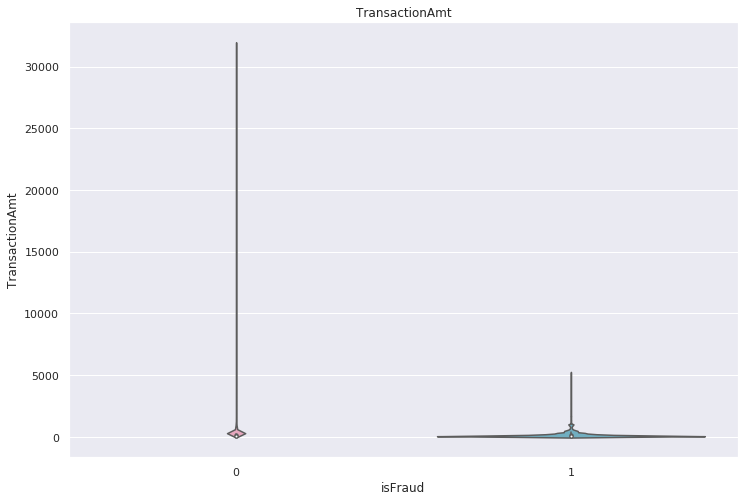

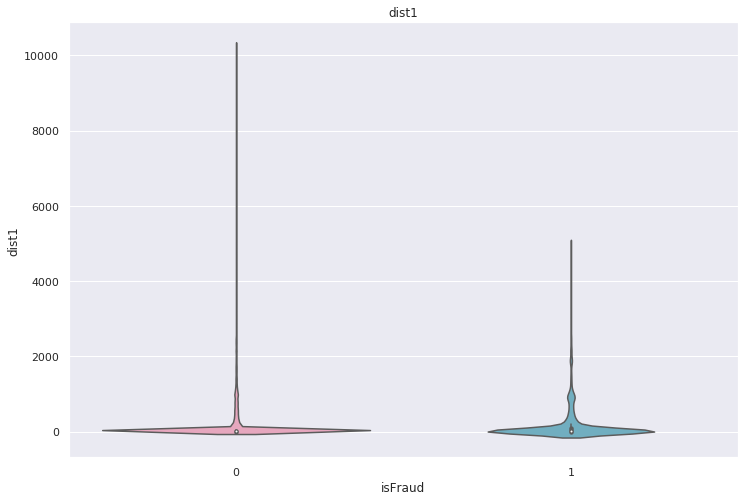

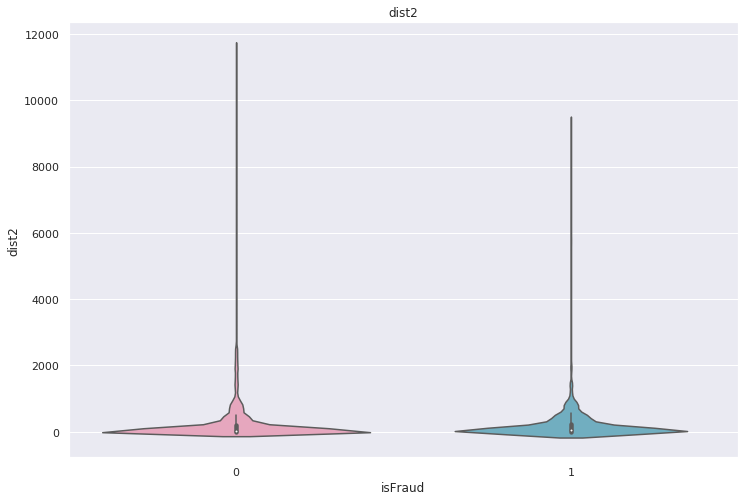

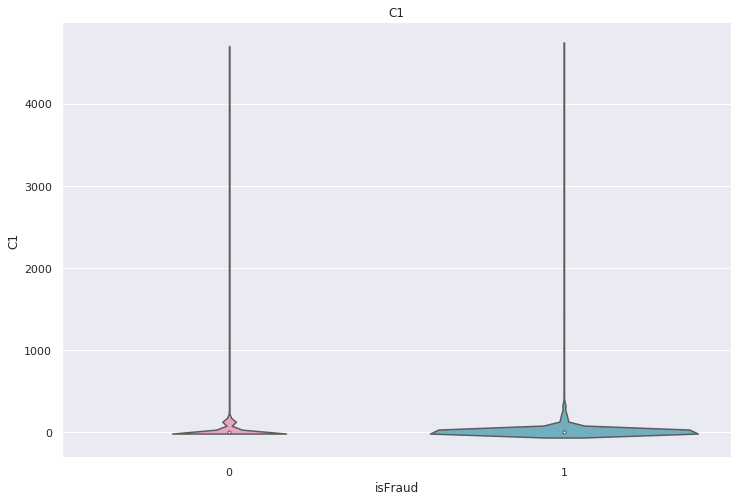

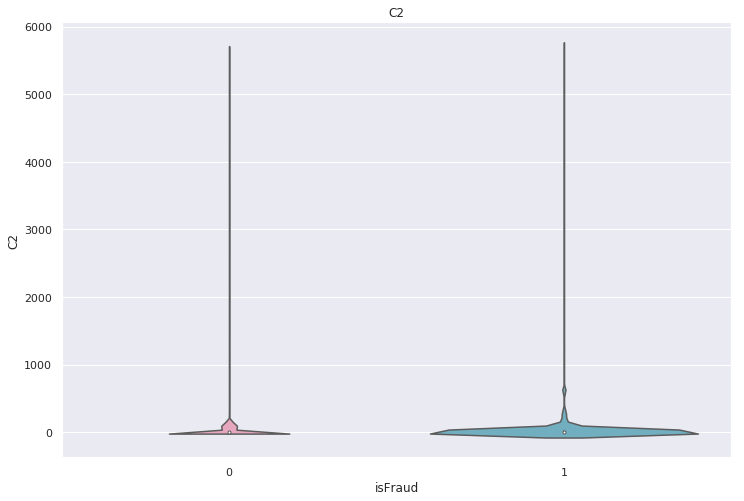

...

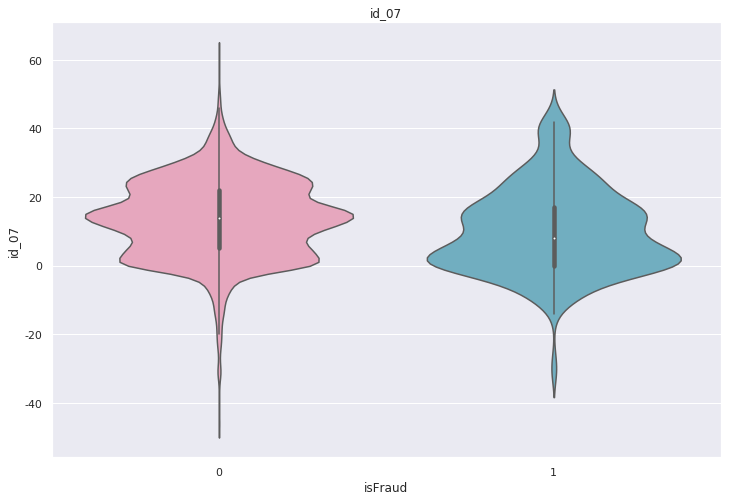

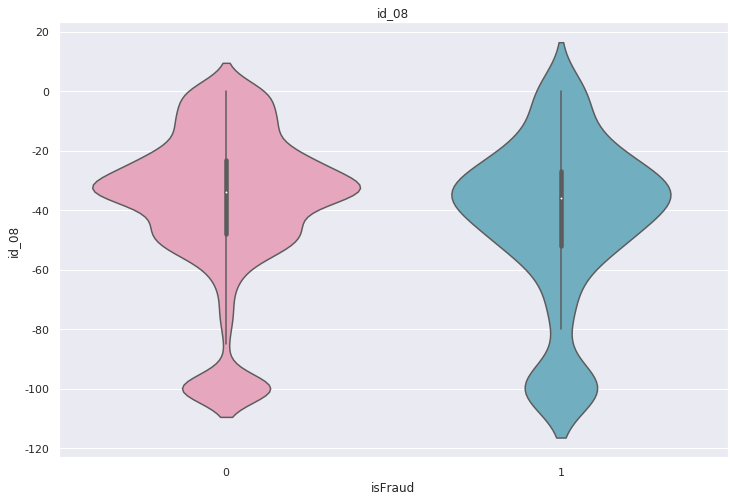

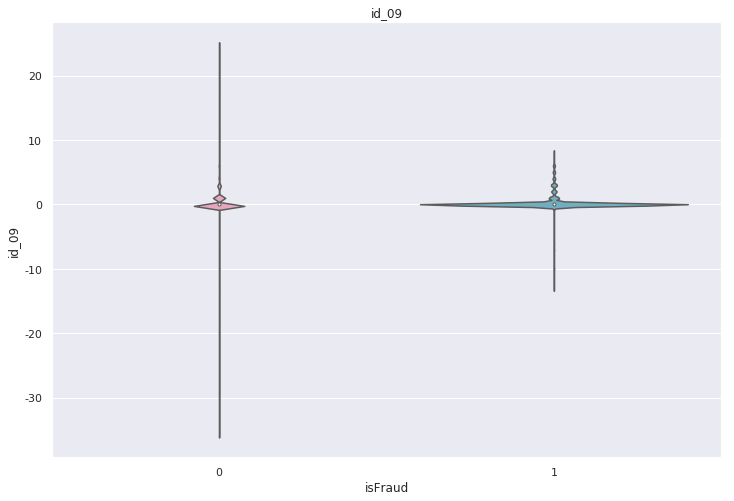

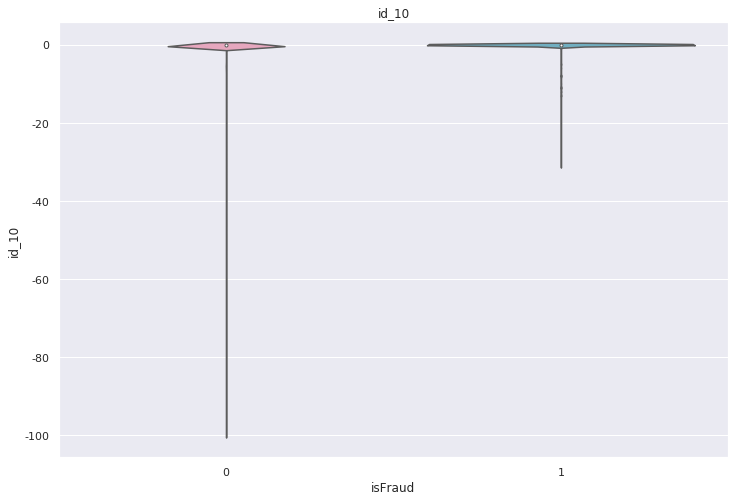

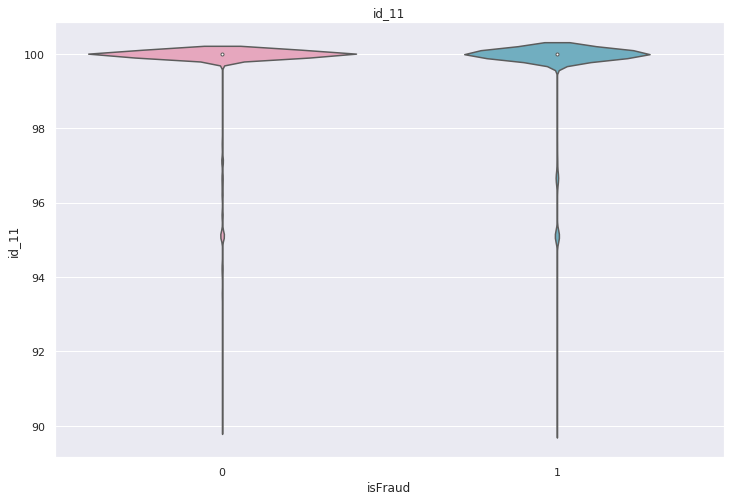

In [89]:
for col in num_col:
    plt.figure(figsize=(12,8))
    plt.title(col)
    sns.violinplot(x='isFraud', y=col, data=train, palette=sns.set_palette(['#F19CBB', '#64B5CD', '#A38CF4']))
    plt.show()
    plt.close()
    gc.collect()

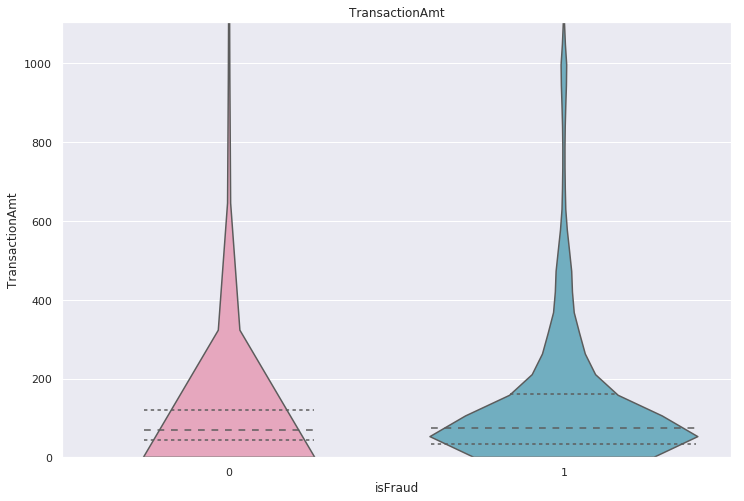

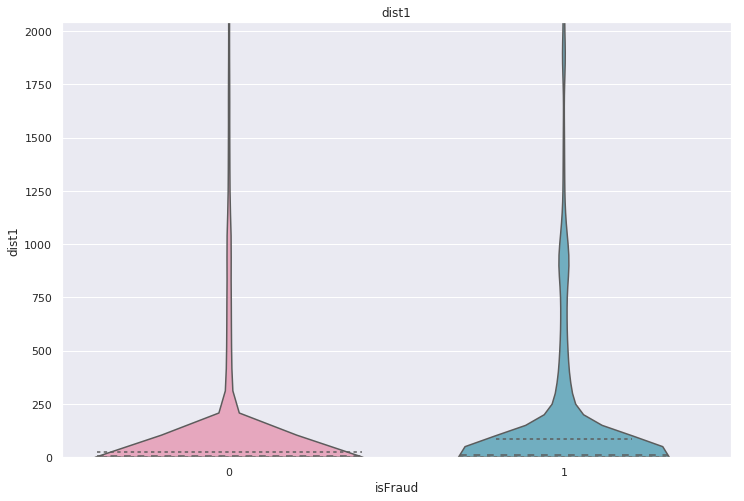

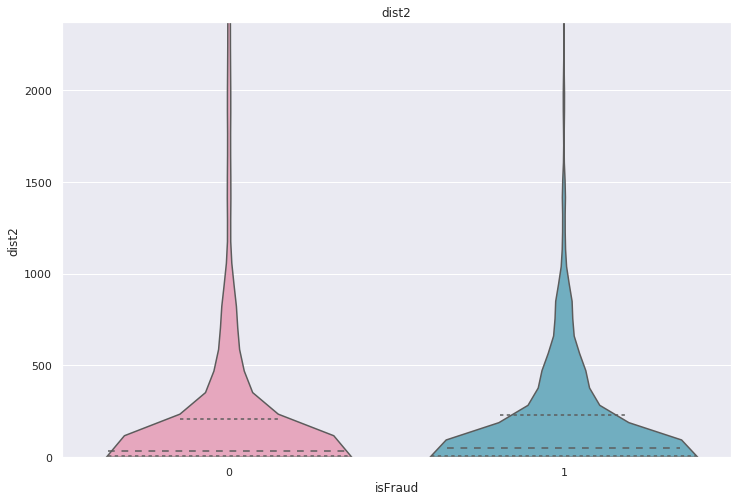

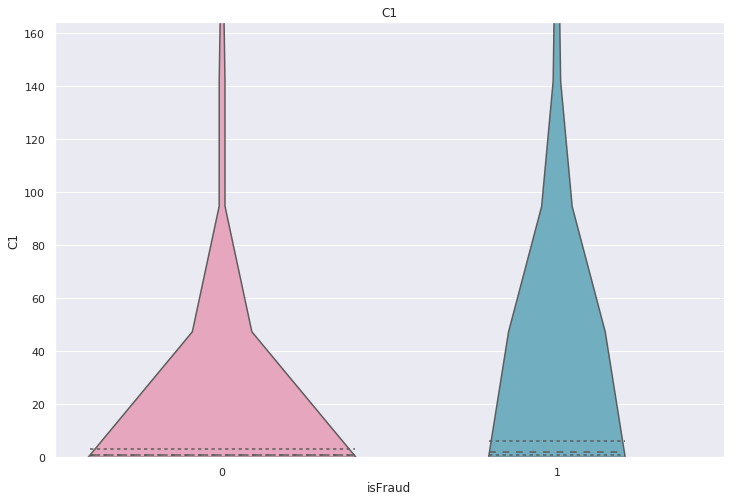

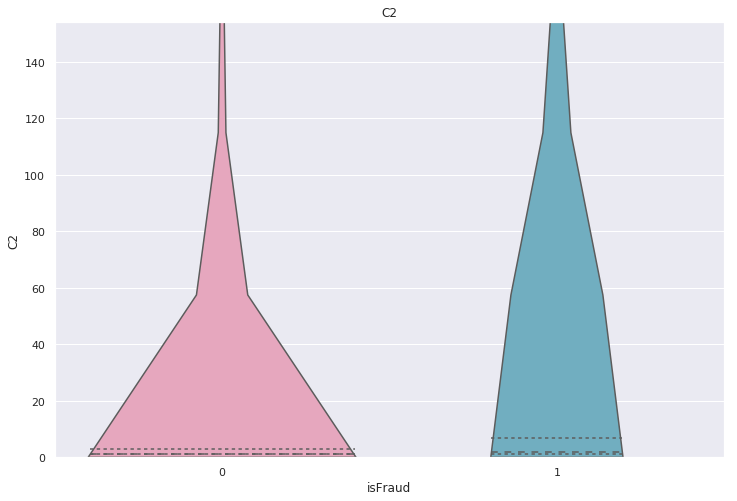

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  ret = ax.set_ylim(*args, **kwargs)


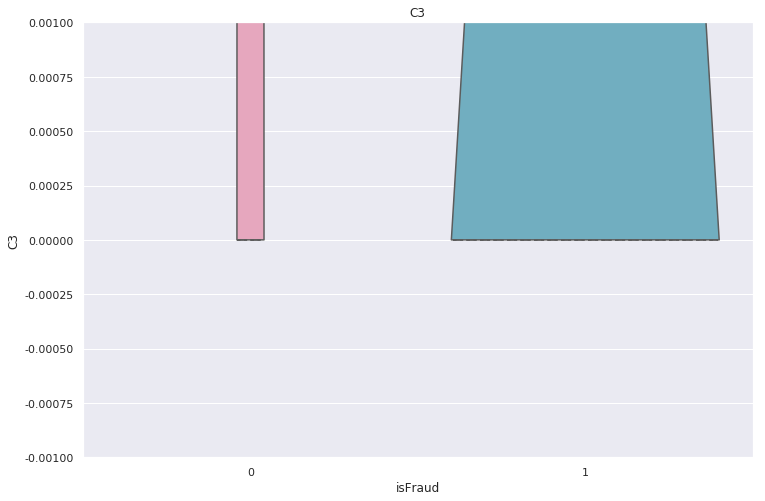

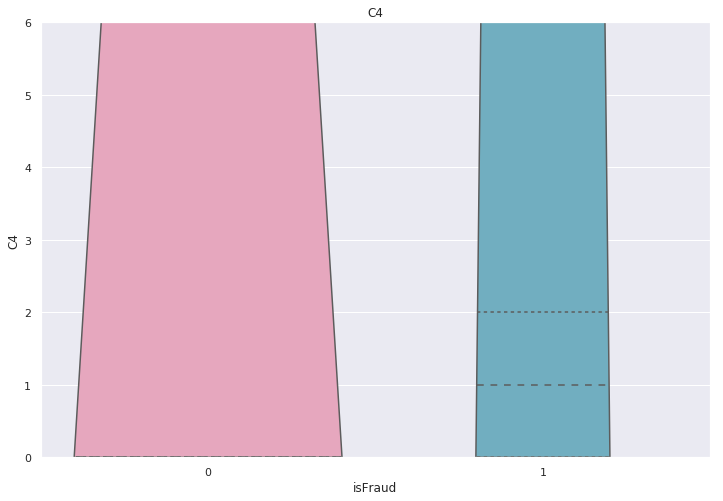

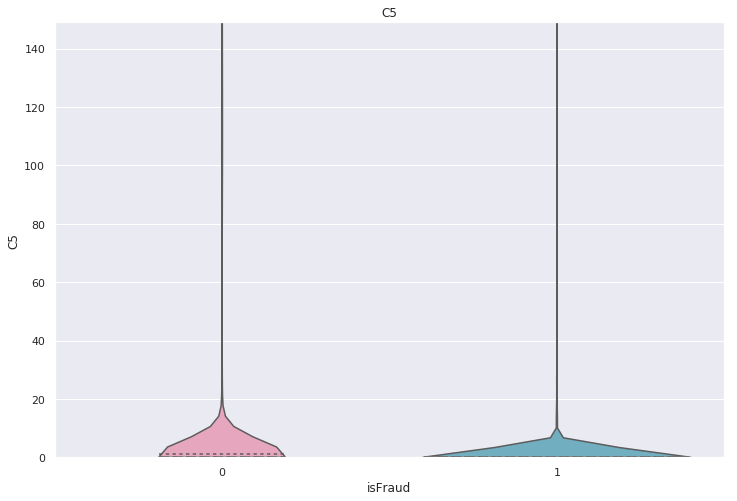

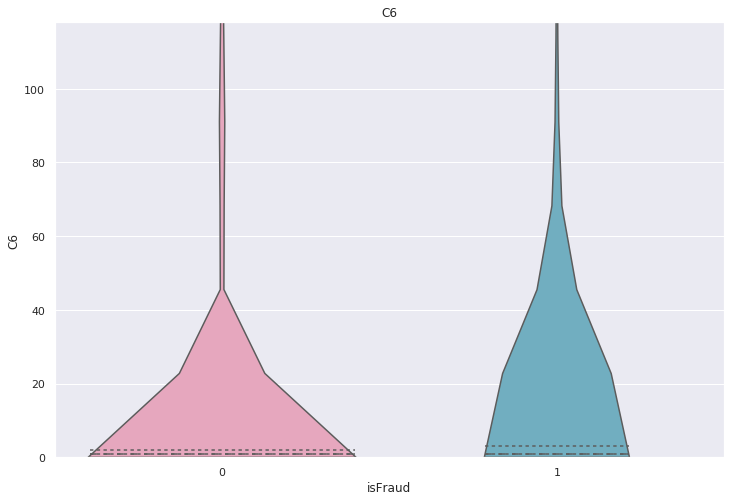

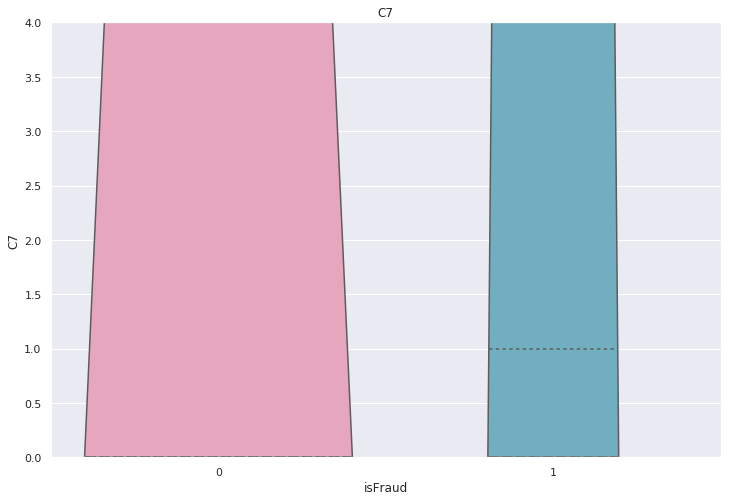

...

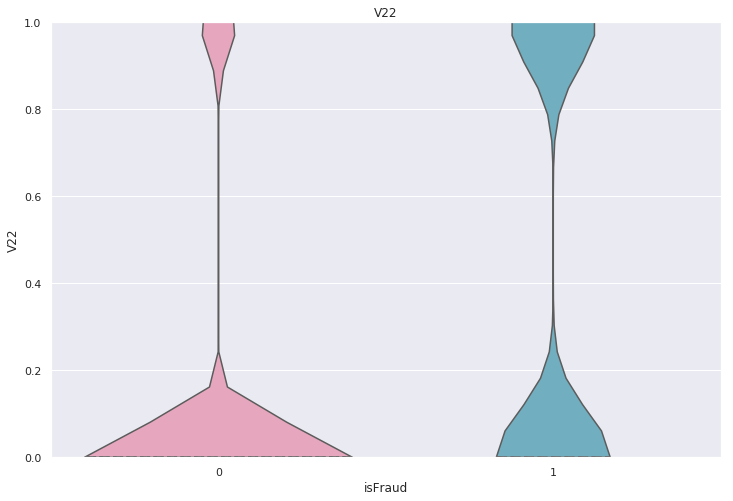

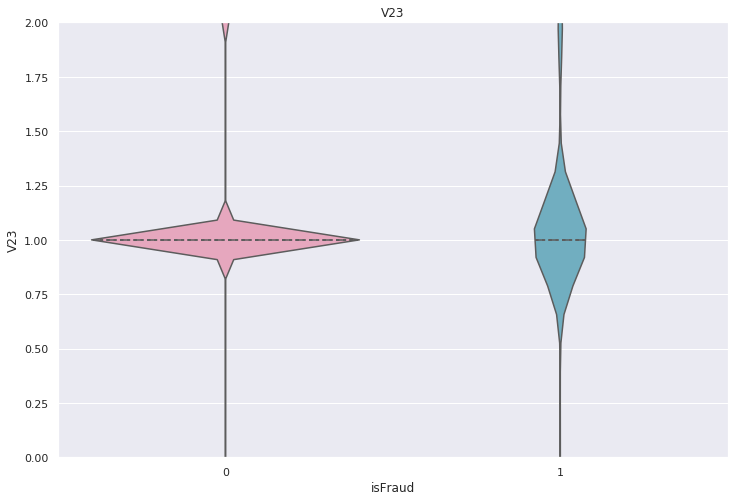

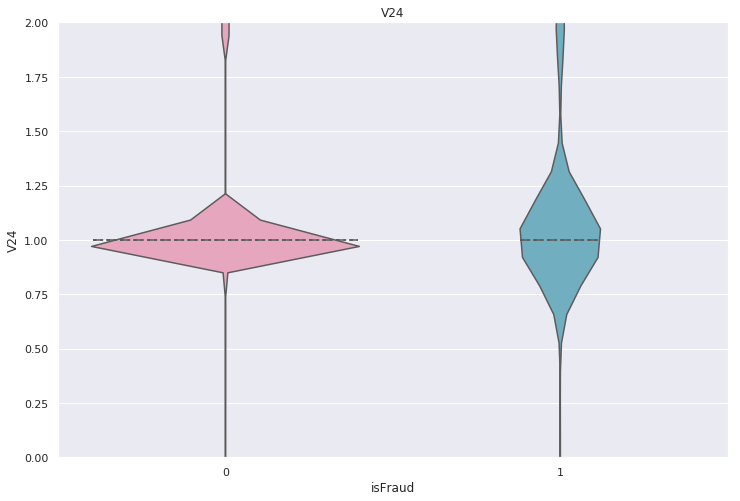

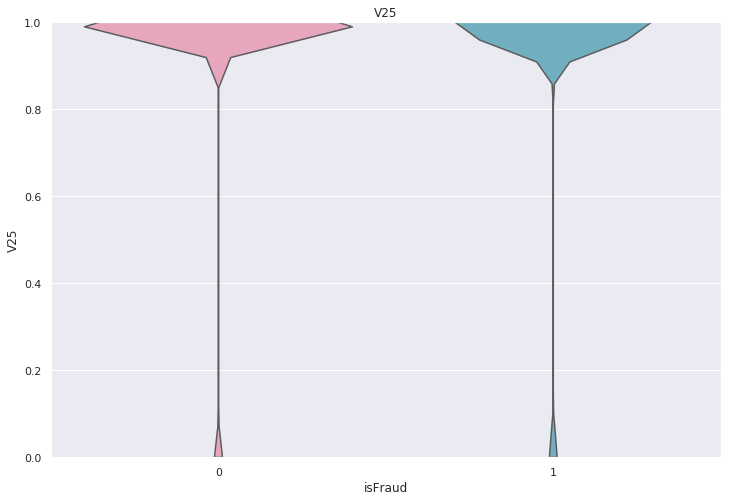

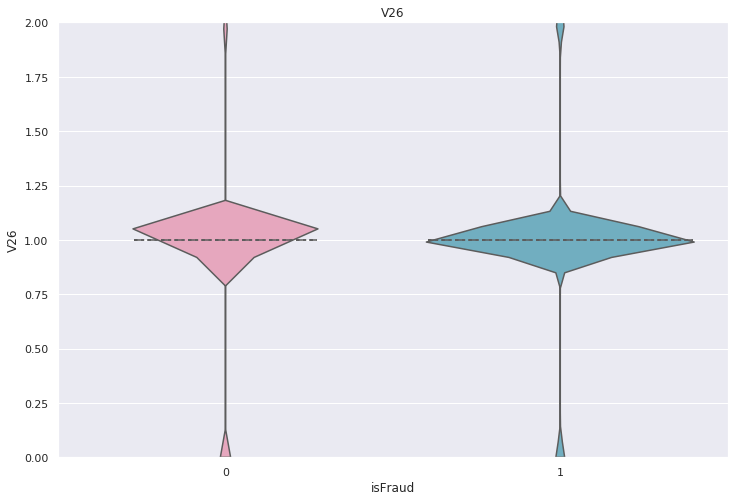

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  ret = ax.set_ylim(*args, **kwargs)


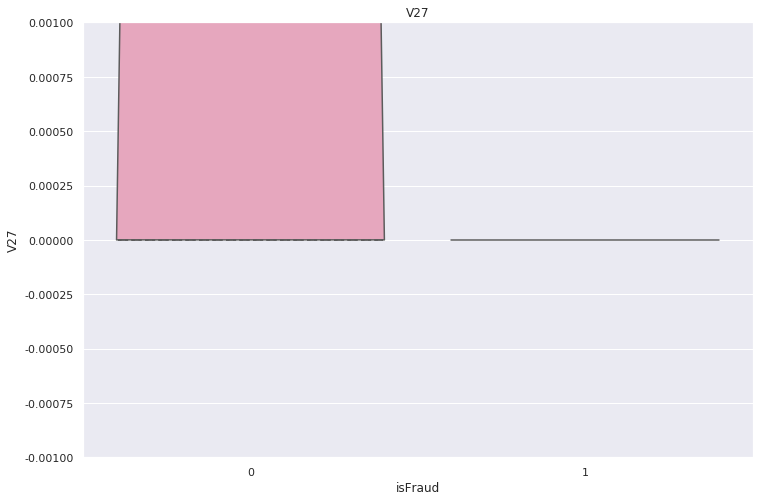

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  ret = ax.set_ylim(*args, **kwargs)


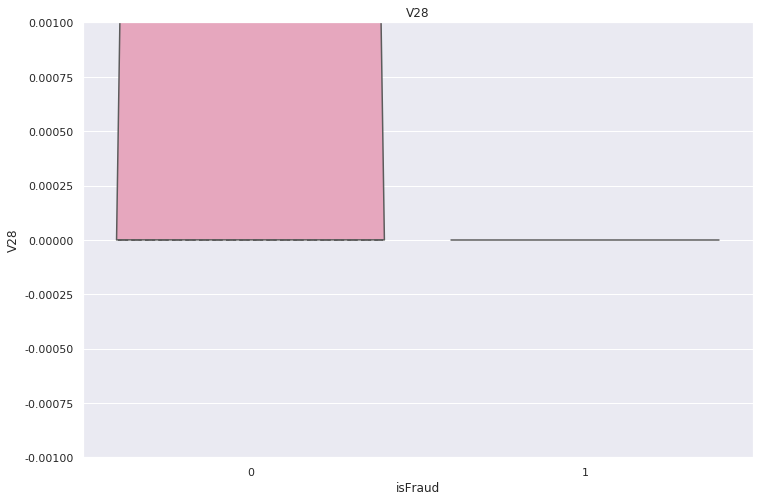

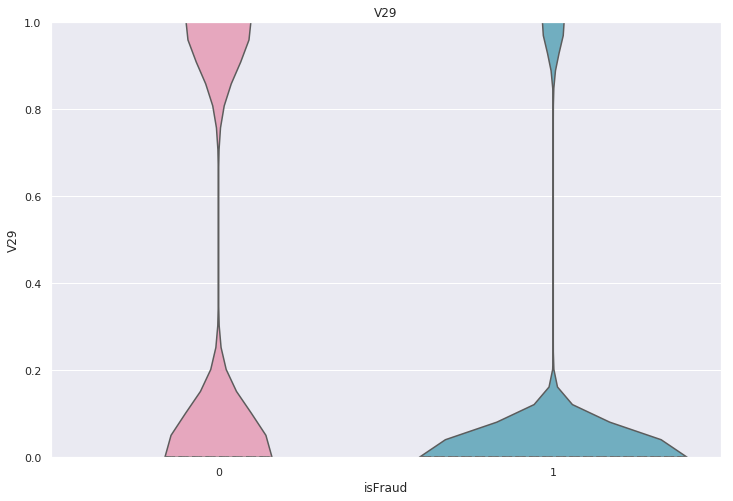

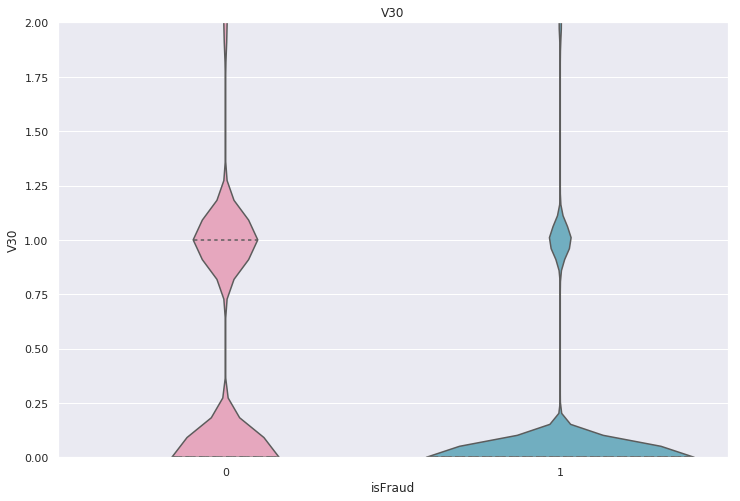

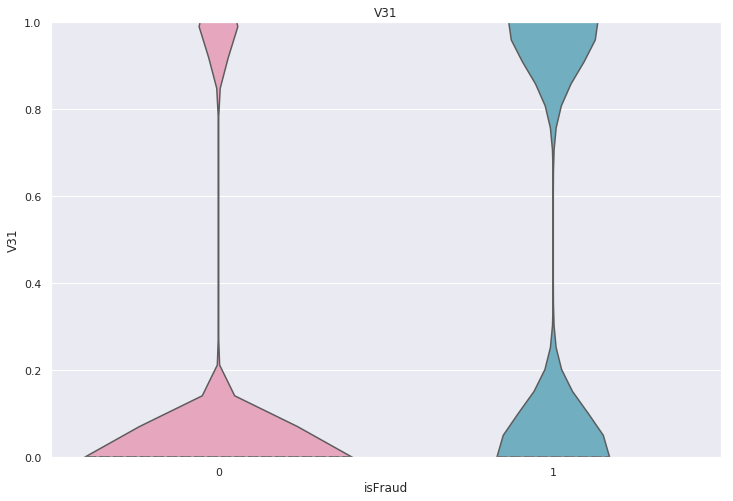

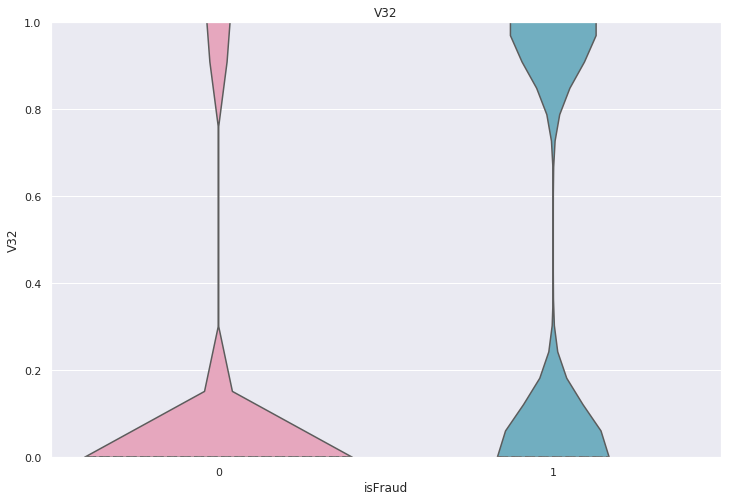

...

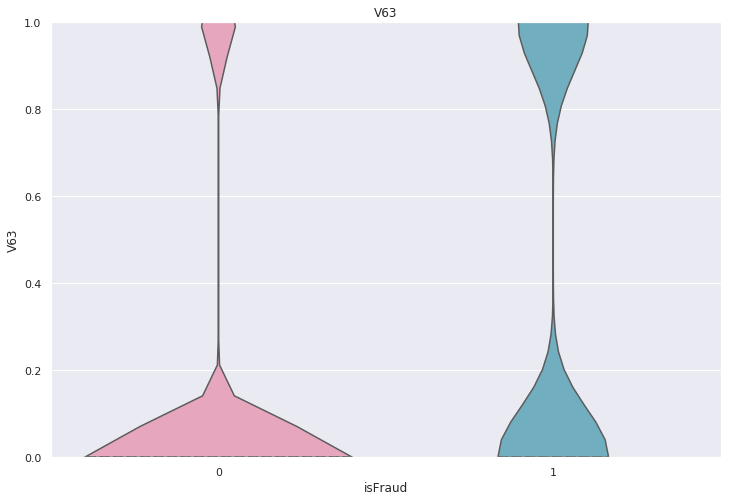

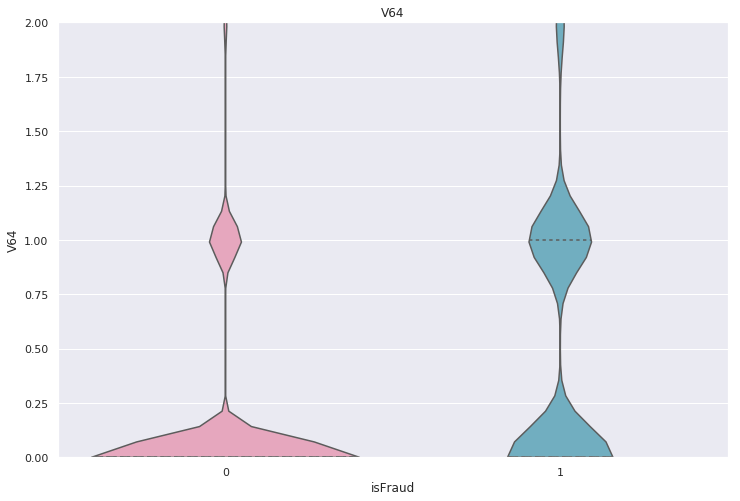

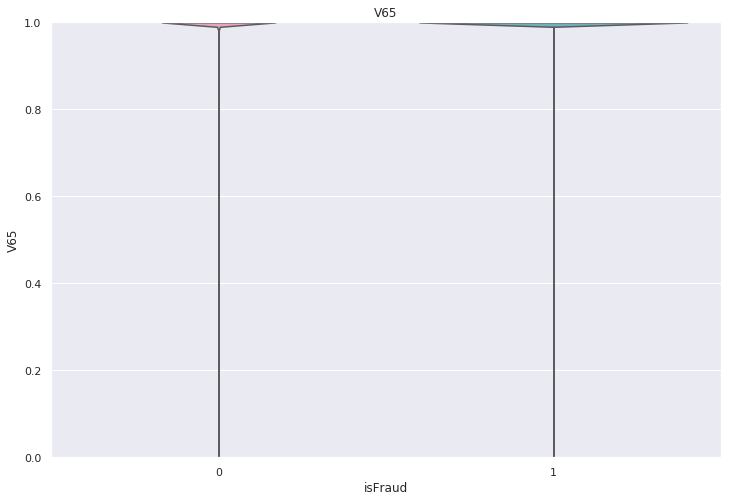

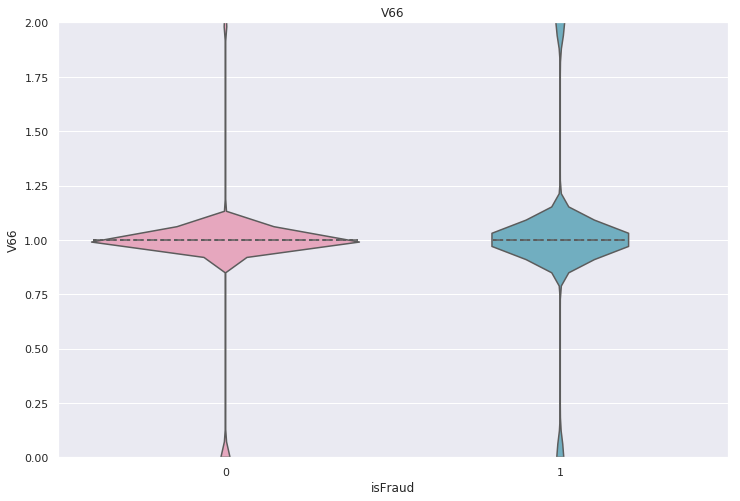

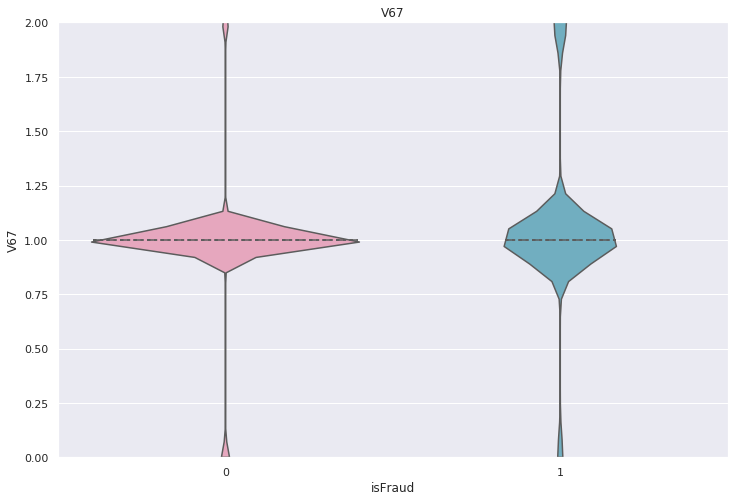

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  ret = ax.set_ylim(*args, **kwargs)


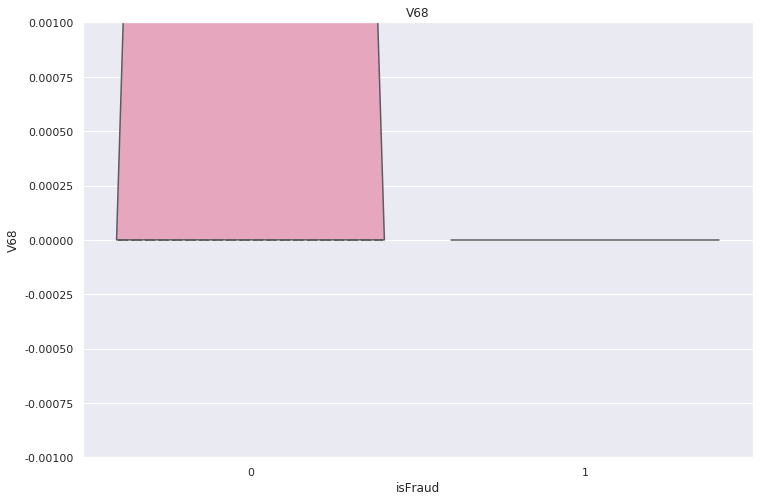

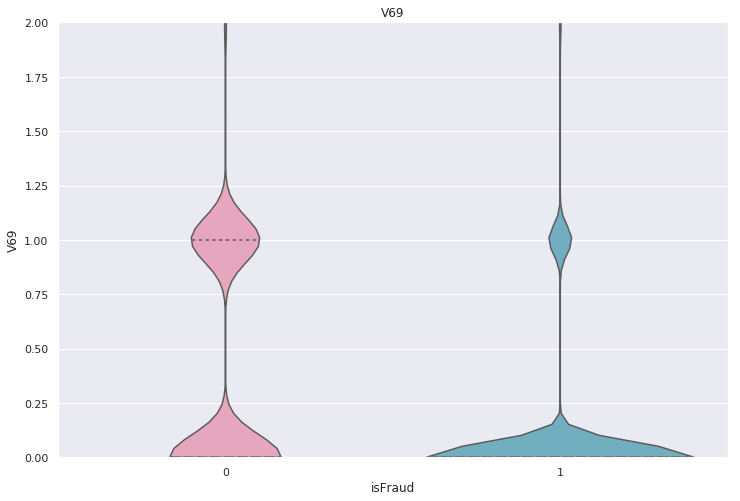

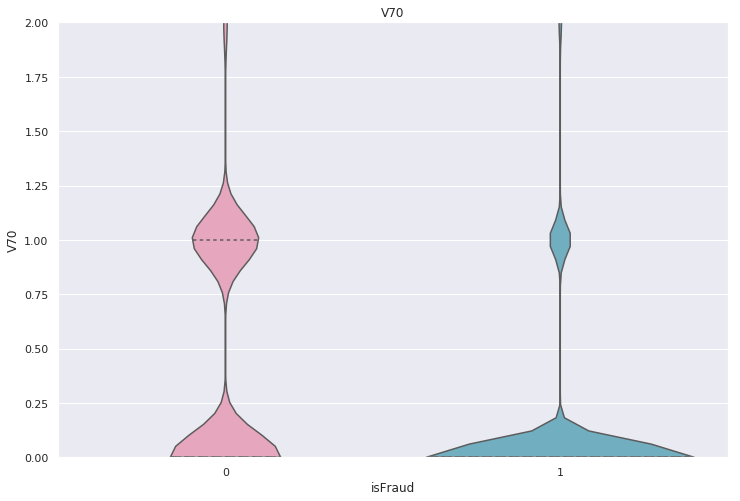

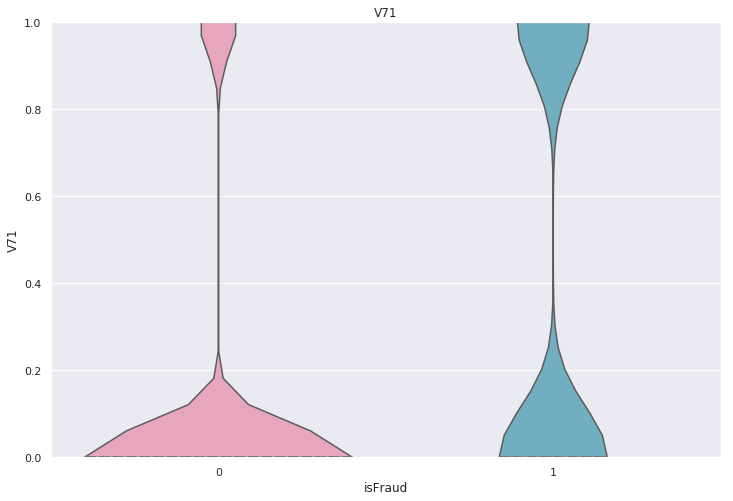

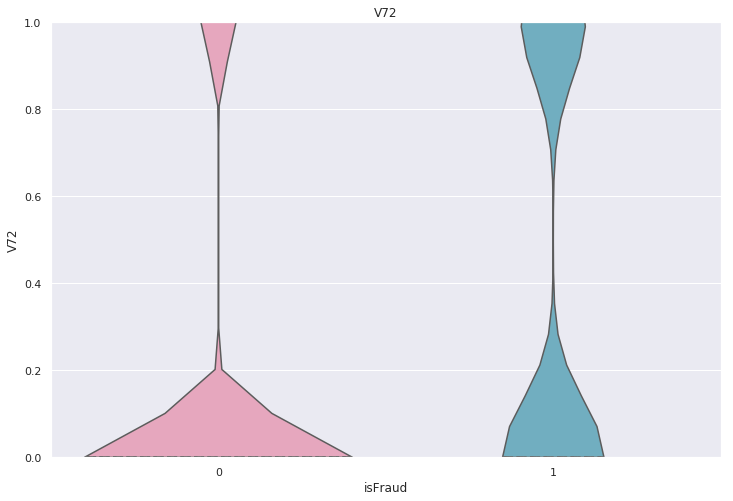

...

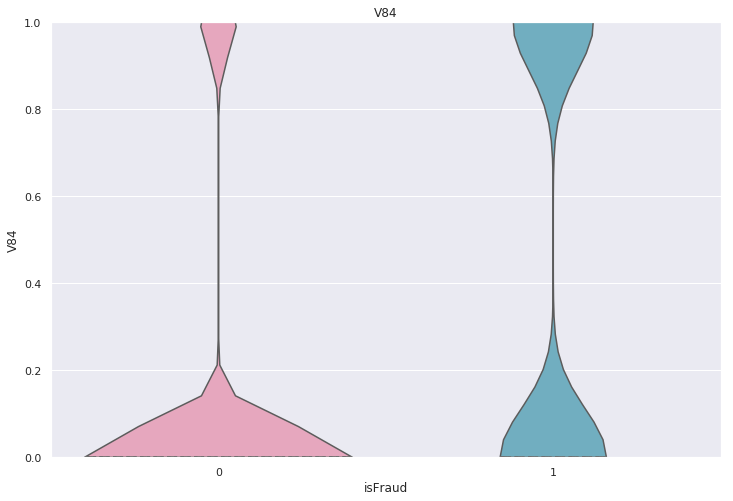

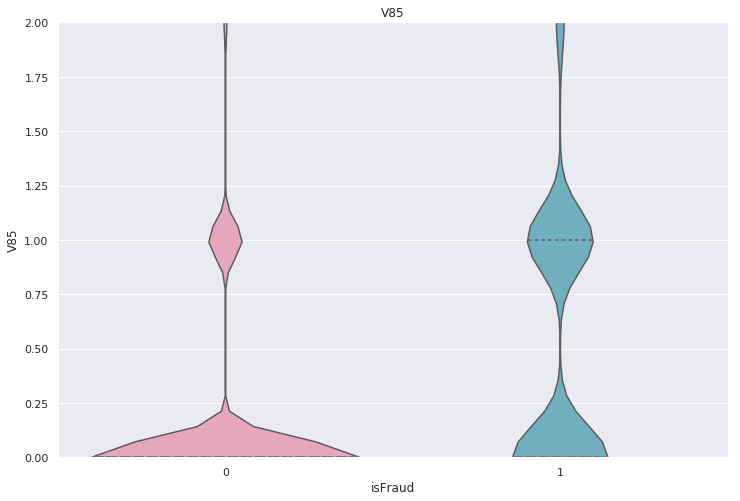

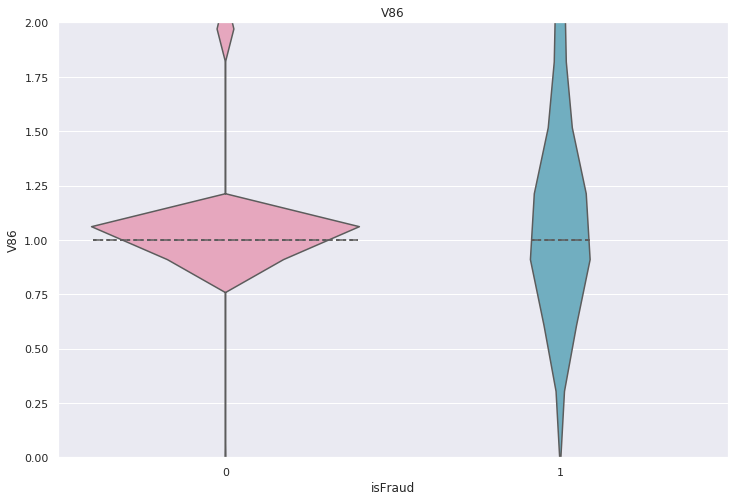

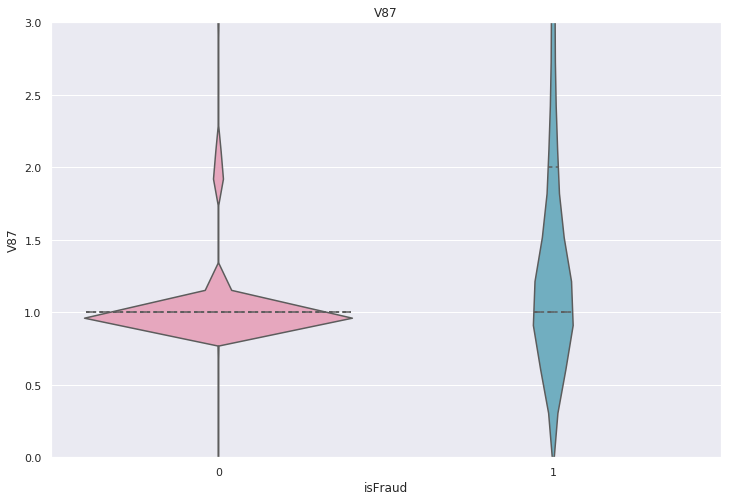

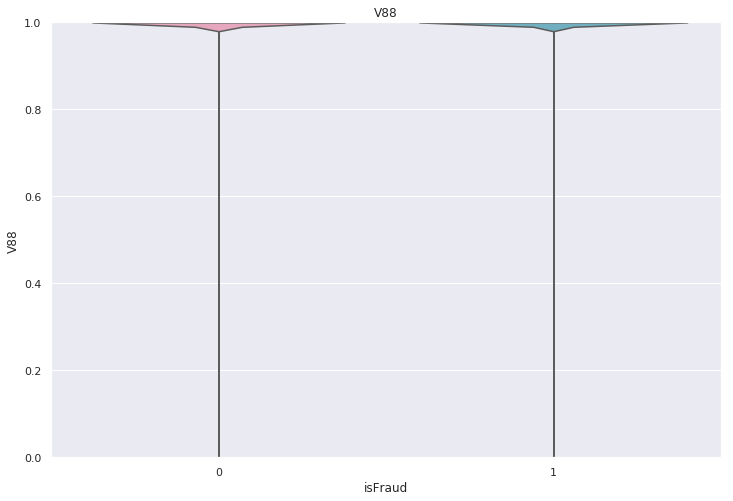

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  ret = ax.set_ylim(*args, **kwargs)


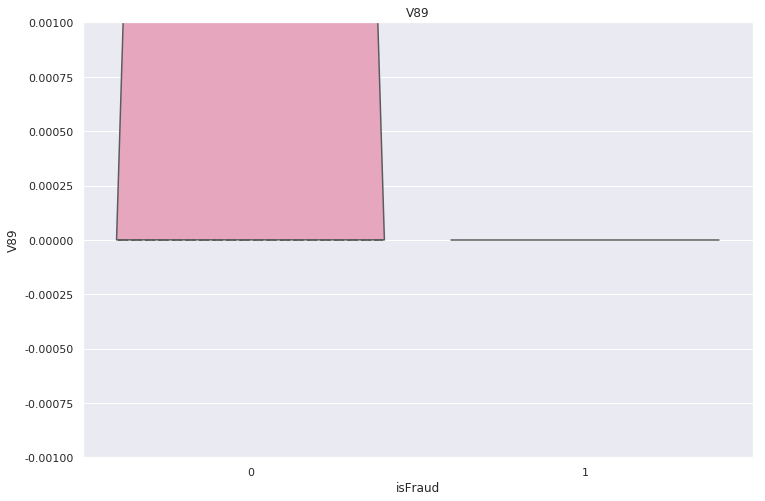

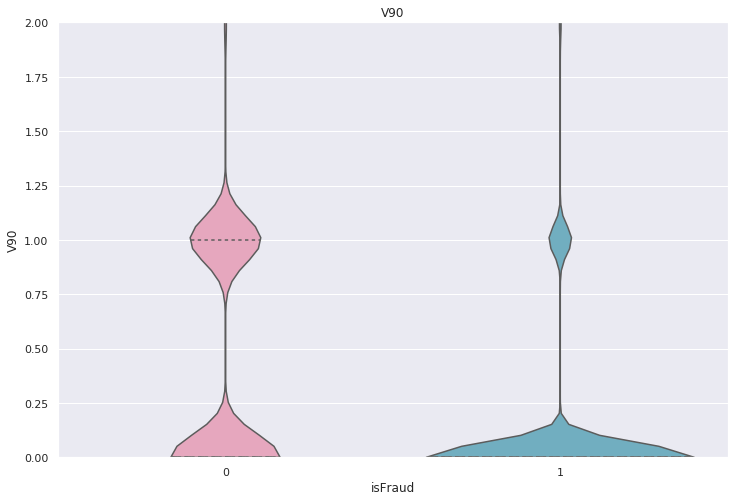

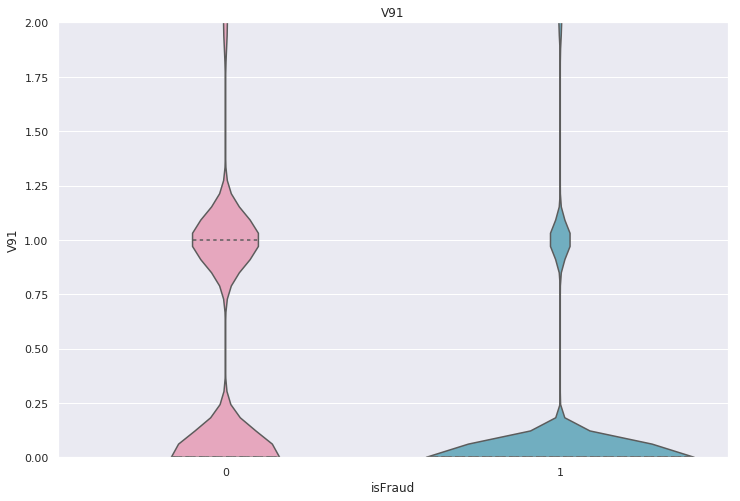

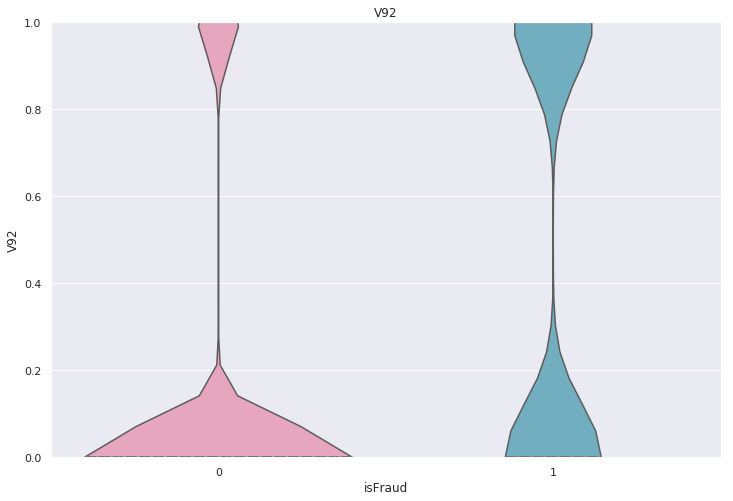

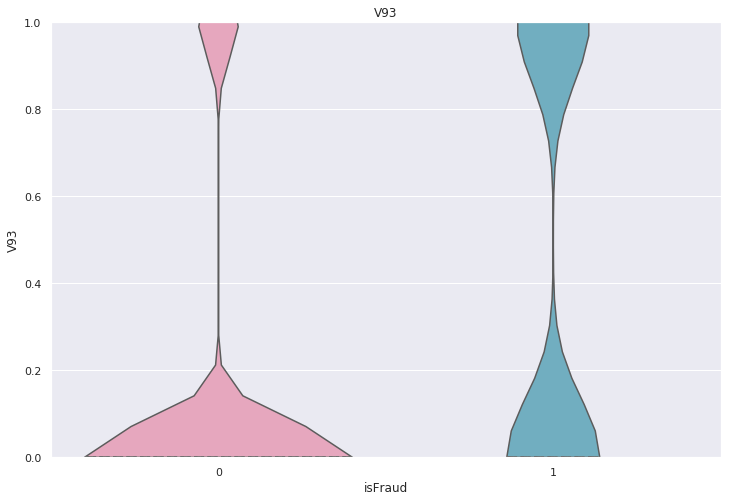

...

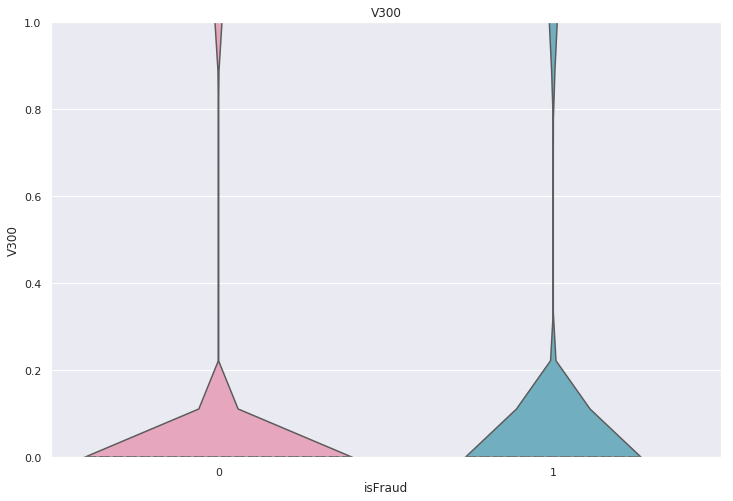

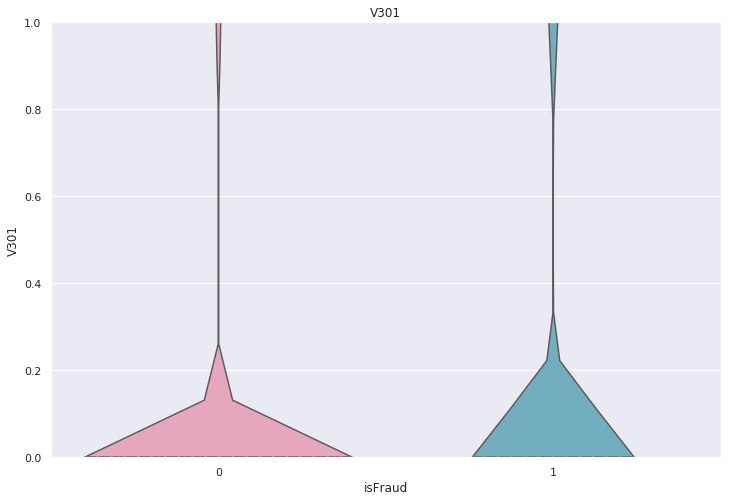

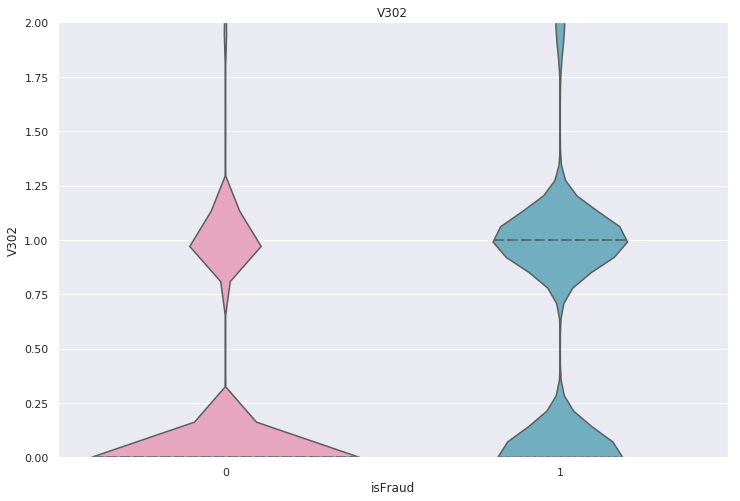

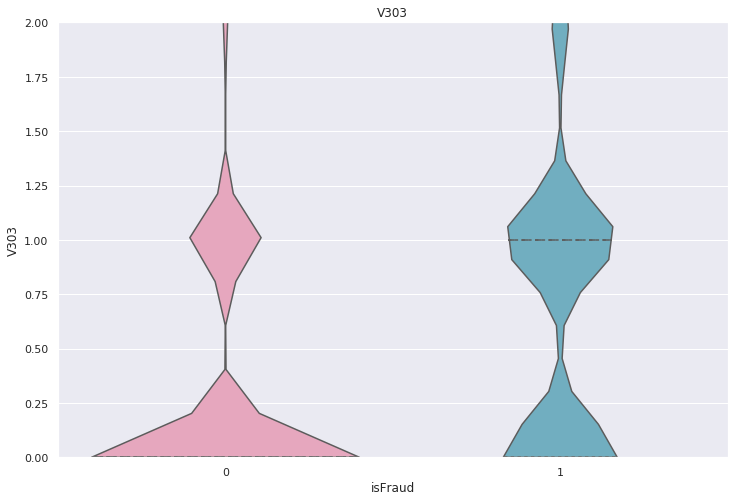

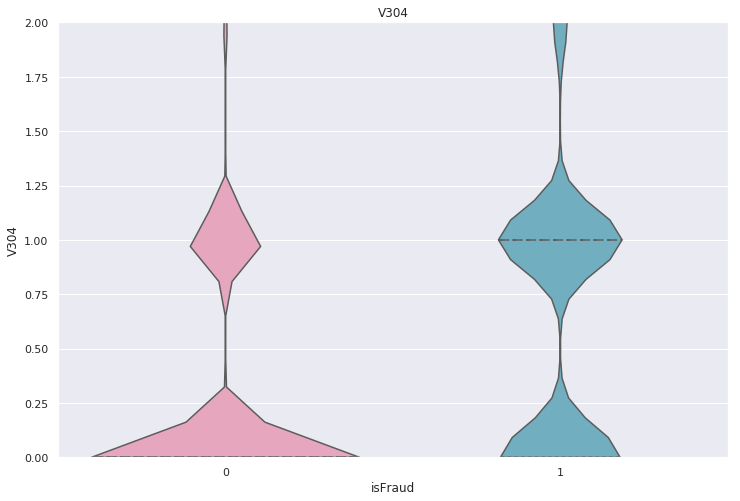

/home/ncp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=1.0, top=1.0
  ret = ax.set_ylim(*args, **kwargs)


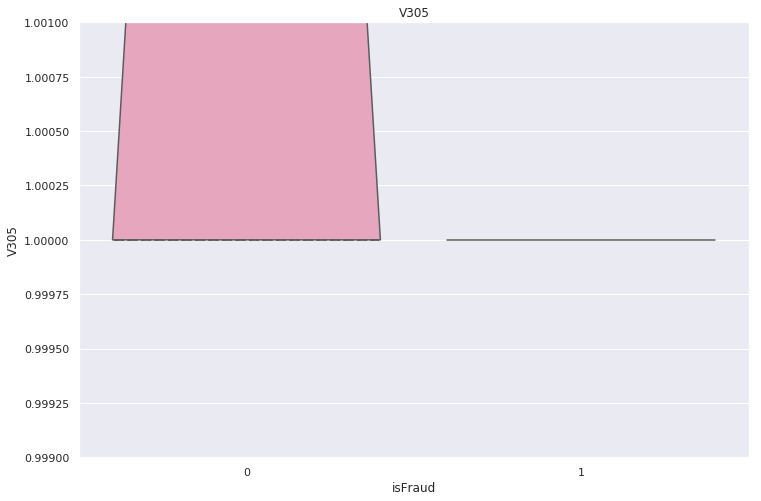

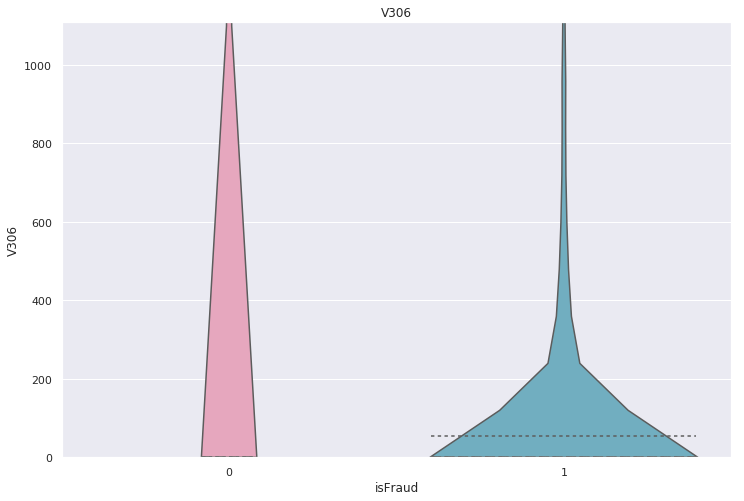

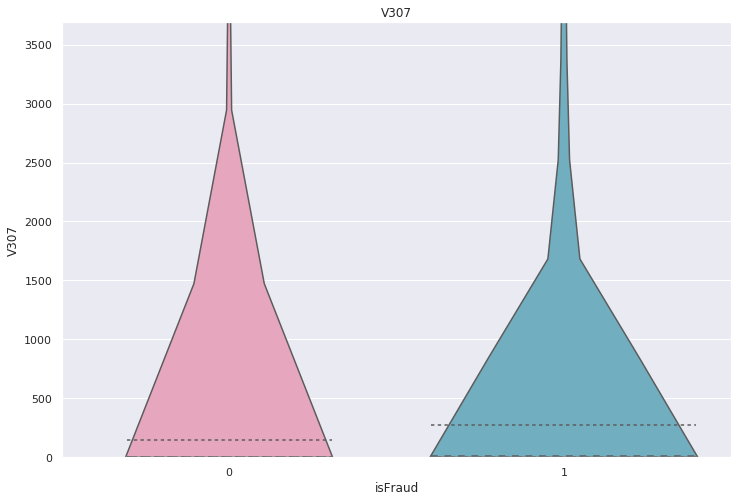

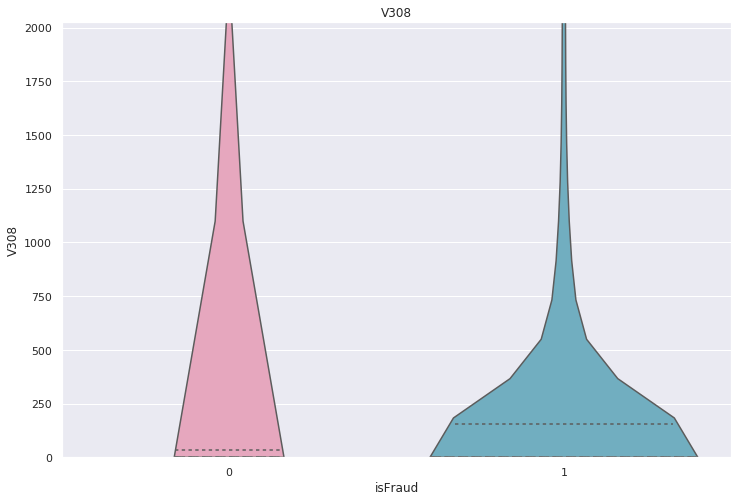

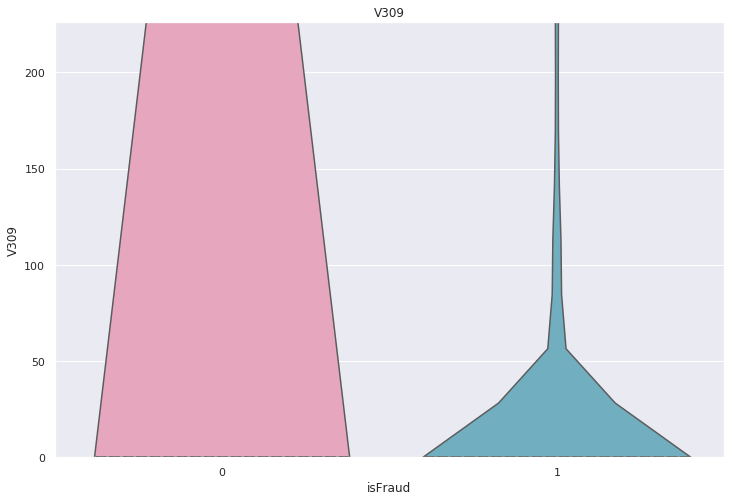

...

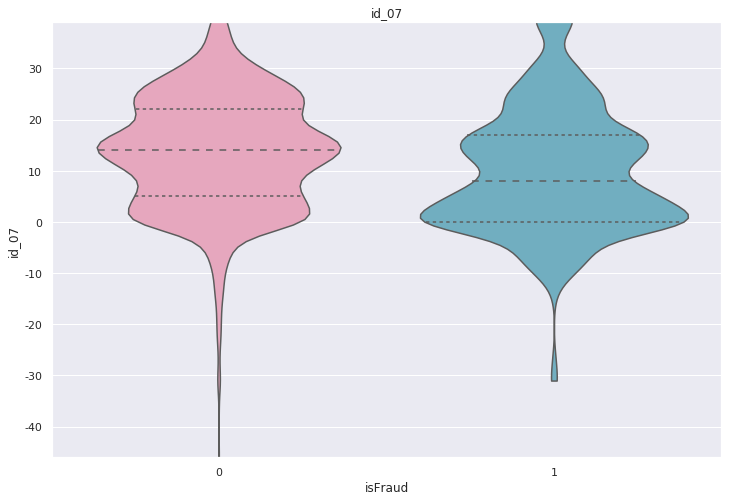

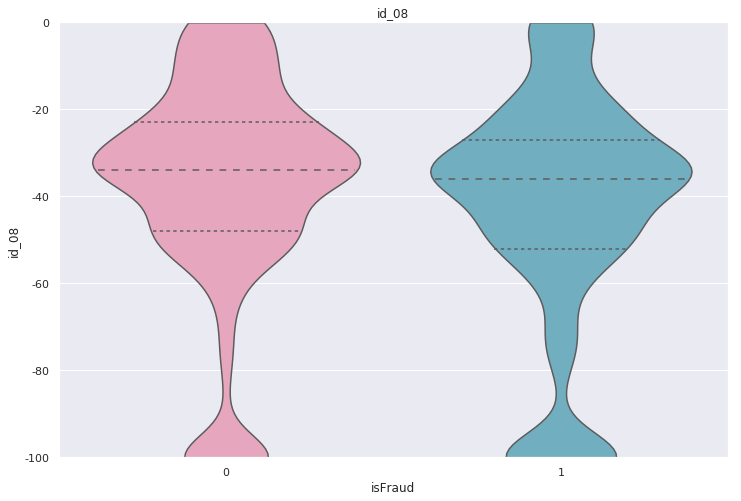

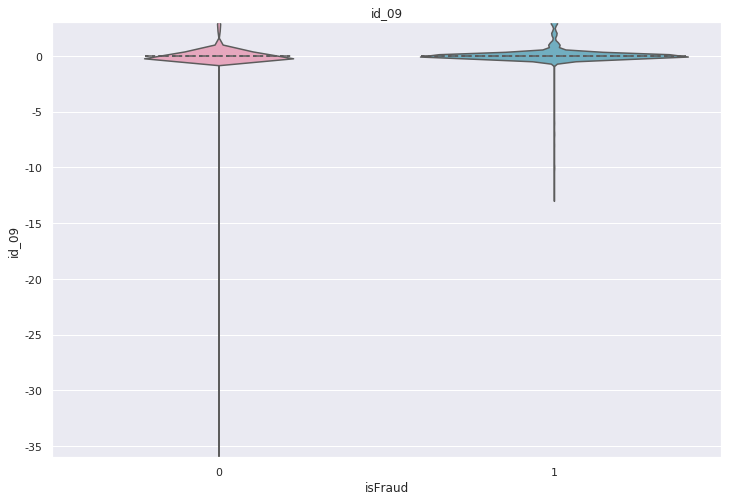

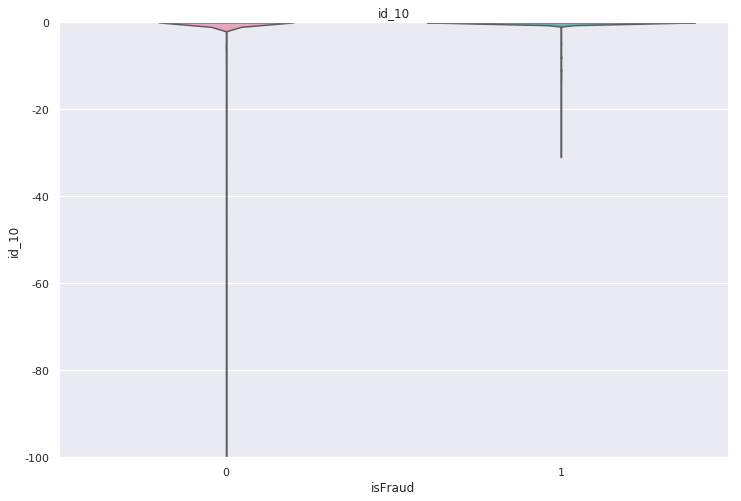

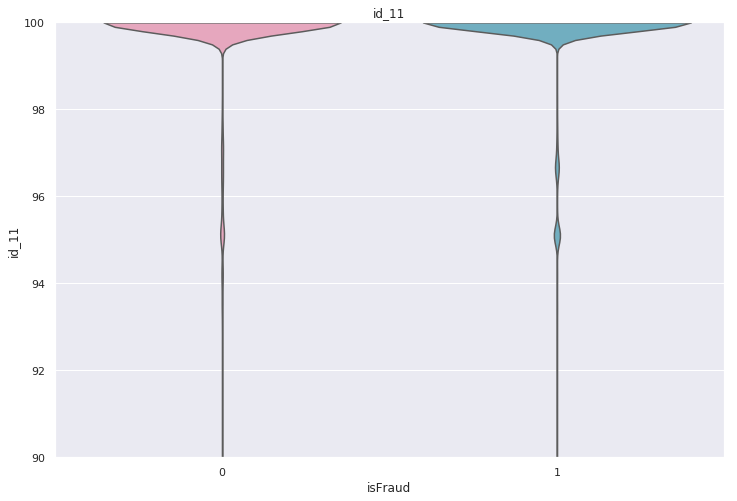

In [88]:
for col in num_col:
    plt.figure(figsize=(12,8))
    plt.title(col)
    sns.violinplot(x='isFraud', y=col, data=train, inner='quartile', bw = 0.2, cut=0,
                   palette=sns.set_palette(['#F19CBB', '#64B5CD', '#A38CF4']))
    q = train[col].quantile([0, .99])
    plt.ylim((q.values[0], q.values[1]))
    plt.show()
    plt.close()
    gc.collect()

In [79]:
a = train['C1'].quantile([.1, .9])
a

0.1    1.0
0.9    7.0
Name: C1, dtype: float64

In [81]:
a.values[1]

7.0

In [82]:
a.values[0]

1.0

In [104]:
missing_value_prop = {
    'features': [],
    'train': [],
    'test': []
}
for col in test.columns:
    missing_value_prop['features'].append(col)
    missing_value_prop['train'].append(round(train[col].isnull().sum() / len(train) * 100, 2))
    missing_value_prop['test'].append(round(test[col].isnull().sum() / len(test) * 100, 2))

missing_value_prop = pd.DataFrame(missing_value_prop)
missing_value_prop

,features,train,test
0,TransactionID,0.00,0.00
1,TransactionDT,0.00,0.00
2,TransactionAmt,0.00,0.00
3,ProductCD,0.00,0.00
4,card1,0.00,0.00
5,card2,1.51,1.71
6,card3,0.27,0.59
7,card4,0.27,0.61
8,card5,0.72,0.90
9,card6,0.27,0.59


In [105]:
missing_value_prop.loc[missing_value_prop['train'] > 80]

,features,train,test
13,dist2,93.63,92.81
35,D6,87.61,75.37
36,D7,93.41,88.13
37,D8,87.31,85.33
38,D9,87.31,85.33
41,D12,89.04,86.33
42,D13,89.51,75.65
43,D14,89.47,77.27
191,V138,86.12,85.04
192,V139,86.12,85.04


In [111]:
train['id_12'].loc[train['isFraud'] == 1].isnull().sum() / 20663

0.45225765861685135

In [112]:
train['id_12'].loc[train['isFraud'] == 0].isnull().sum() / 569877

0.7667654599150343

In [ ]:
train['isFraud'].value_counts()

[Contents](#Contents)

### Features

In [48]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values

    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = round(stats.entropy(df[name].value_counts(normalize=True), base=2),2) 

    return summary

def CalcOutliers(df_num): 

    # calculating mean and std of the array
    data_mean, data_std = np.mean(df_num), np.std(df_num)

    # seting the cut line to both higher and lower values
    # You can change this value
    cut = data_std * 3

    #Calculating the higher and lower cut values
    lower, upper = data_mean - cut, data_mean + cut

    # creating an array of lower, higher and total outlier values 
    outliers_lower = [x for x in df_num if x < lower]
    outliers_higher = [x for x in df_num if x > upper]
    outliers_total = [x for x in df_num if x < lower or x > upper]

    # array without outlier values
    outliers_removed = [x for x in df_num if x > lower and x < upper]
    
    print('Identified lowest outliers: %d' % len(outliers_lower)) # printing total number of values in lower cut of outliers
    print('Identified upper outliers: %d' % len(outliers_higher)) # printing total number of values in higher cut of outliers
    print('Total outlier observations: %d' % len(outliers_total)) # printing total number of values outliers of both sides
    print('Non-outlier observations: %d' % len(outliers_removed)) # printing total number of non outlier values
    print("Total percentual of Outliers: ", round((len(outliers_total) / len(outliers_removed) )*100, 4)) # Percentual of outliers in points
    
    return

### `TransactionAmt`

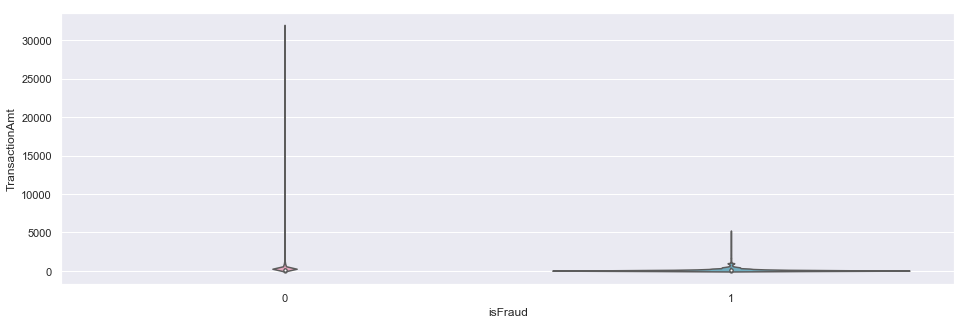

In [54]:
plt.figure(figsize=(16,5))
sns.violinplot(x='isFraud', y='TransactionAmt', data=train, palette=sns.set_palette(['#F19CBB', '#64B5CD']))
plt.show()

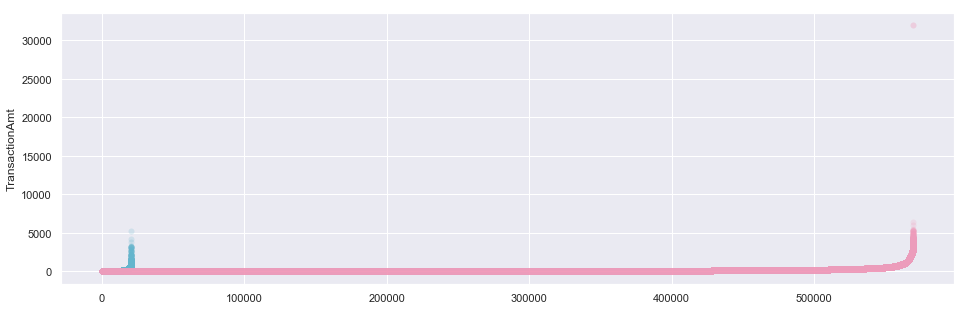

In [72]:
plt.figure(figsize=(16,5))
temp = train.loc[train['isFraud'] == 1, ['TransactionAmt']].sort_values(by='TransactionAmt').reset_index()
sns.scatterplot(x=temp.index, y='TransactionAmt', data=temp, alpha=.2, color=['#64B5CD'], linewidth=0)
del temp
temp = train.loc[train['isFraud'] == 0, ['TransactionAmt']].sort_values(by='TransactionAmt').reset_index()
sns.scatterplot(x=temp.index, y='TransactionAmt', data=temp, alpha=.2, color=['#F19CBB'], linewidth=0)
del temp
plt.show()

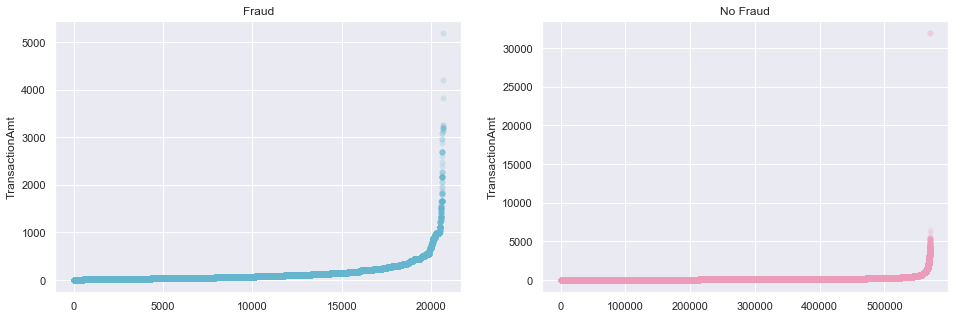

In [76]:
plt.figure(figsize=(16,5))
plt.subplot(121)
plt.title('Fraud')
temp = train.loc[train['isFraud'] == 1, ['TransactionAmt']].sort_values(by='TransactionAmt').reset_index()
sns.scatterplot(x=temp.index, y='TransactionAmt', data=temp, alpha=.2, color=['#64B5CD'], linewidth=0)
del temp

plt.subplot(122)
plt.title('No Fraud')
temp = train.loc[train['isFraud'] == 0, ['TransactionAmt']].sort_values(by='TransactionAmt').reset_index()
sns.scatterplot(x=temp.index, y='TransactionAmt', data=temp, alpha=.2, color=['#F19CBB'], linewidth=0)
del temp
plt.show()

In [75]:
print(pd.concat([train.loc[train['isFraud'] == 1, 'TransactionAmt']\
                 .quantile([.01, .1, .25, .5, .75, .9, .99])\
                 .reset_index(), 
                 train.loc[train['isFraud'] == 0, 'TransactionAmt']\
                 .quantile([.01, .1, .25, .5, .75, .9, .99])\
                 .reset_index()],
                axis=1, keys=['Fraud', 'No Fraud']))

  Fraud                No Fraud               
  index TransactionAmt    index TransactionAmt
0  0.01        6.74096     0.01        9.51288
1  0.10       18.93600     0.10       26.31000
2  0.25       35.04400     0.25       43.97000
3  0.50       75.00000     0.50       68.50000
4  0.75      161.00000     0.75      120.00000
5  0.90      335.00000     0.90      267.11200
6  0.99      994.00000     0.99     1104.00000


In [80]:
CalcOutliers(train['TransactionAmt'])

Identified lowest outliers: 0
Identified upper outliers: 10093
Total outlier observations: 10093
Non-outlier observations: 580447
Total percentual of Outliers:  1.7388


In [60]:
train.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7',
       'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17',
       'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27',
       'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37',
       'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47',
       'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57',
       'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67',
       'V6

# 2. Feature Engineering

[Contents](#Contents)

# 3. Modeling

[Contents](#Contents)